In [1]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [2]:
# !pip install q keras==2.3.1
# !pip install q tensorflow==2.2.0 
# !pip install imgaug --upgrade

In [3]:
# import os
# os.environ["KERAS_BACKEND"] = "plaidml.keras.backend"

In [1]:
import PIL
from PIL import Image
import numpy as np

def background_thumbnail(template, modality, thumbnail_size=(200,200)):
    foreground = Image.fromarray(template).convert(modality)
    background = Image.new(modality, thumbnail_size, "white")
    foreground.thumbnail(thumbnail_size)
    (w, h) = foreground.size
    
    upper_left=(int((thumbnail_size[0] - w) / 2), int((thumbnail_size[1] - h) / 2))
    background.paste(foreground, upper_left)
    return np.array(background)

In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt


def maxDeviationThresh(hist):
    maximum = max(hist)
    index_max = list(hist).index(maximum)
    index_min = 0
    for i in range(0, index_max):
        if not hist[i] and hist[i+1]:
            index_min = i
            break
    distances = []
    x1 = index_min
    y1 = hist[index_min]
    x2 = index_max
    y2 = hist[index_max]
    for i in range(index_min + 1, index_max):
        x0 = i
        y0 = hist[i]
        distance = np.abs((y2 - y1) * x0 - (x2 - x1) * y0 + x2 * y1 - y2 * x1) / np.sqrt(
            (y2 - y1) ** 2 + (x2 - x1) ** 2)
        distances.append(distance)

    T_index = distances.index(max(distances))
    return T_index + index_min


def extractDrawing(img):
  dst = cv2.bilateralFilter(img, 10, sigmaColor=15, sigmaSpace=15)
  #dst = img.copy()
  #max_occ = np.bincount(dst[dst > 0]).argmax()
  #dst[dst == 0] = max_occ
  threshed = np.ones(dst.shape, np.uint8) * 255
  if np.any(dst < 255):
      hist, _ = np.histogram(dst[dst < 255].flatten(), range(257))
      thresh_val = maxDeviationThresh(hist)
      mask = dst < thresh_val
      threshed[mask] = 0
  return threshed

In [3]:
import os
import cv2
import numpy as np
from imgaug import augmenters as iaa
from imgaug import parameters as iap
from matplotlib import pyplot as plt
import pandas as pd

test = '../cropped'
validation = '../cropped_validation'
input_image_shape = (150, 150, 3)

def augmentation_different(images):
  seq = iaa.Sequential([
        iaa.Fliplr(0.5),  # horizontally flip 50% of the images
        iaa.Sometimes(
            0.5,
            iaa.GaussianBlur(sigma=(0, 0.5))
        ),  # blur images with a sigma of 0 to 3.0
        #iaa.Multiply((0.8, 1.2), per_channel=0.2),
        iaa.Affine(scale=(0.85, 1.15),
                   rotate=iap.Normal(iap.Choice([-20, 20]), 5),
                   shear=iap.Normal(iap.Choice([-20, 20]), 5), fit_output=True, mode='constant', cval=(255,255)),
        iaa.TranslateX(percent=iap.Normal(iap.Choice([-0.1, 0.1]), 0.05), cval=255),
        iaa.TranslateY(percent=iap.Normal(iap.Choice([-0.1, 0.1]), 0.05), cval=255),
        iaa.ScaleY(iap.Normal(iap.Choice([0.75, 1.25]), 0.2), cval=255),
        #iaa.PerspectiveTransform(scale=(0.01, 0.05)),
        iaa.PiecewiseAffine(scale=(0.05, 0.1)),
        iaa.WithPolarWarping(iaa.CropAndPad(percent=(-0.0025, 0.0025)))
        #iaa.Pad(percent=(0, 0.2), pad_mode='constant', pad_cval=constant_values)
        ], random_order=True)
  return seq(images=images)

def augmentation(images):
    constant_values = [np.argmax(np.bincount(image.ravel())) for image in images]
    seq = iaa.Sequential([
        # iaa.Fliplr(0.5),  # horizontally flip 50% of the images
        iaa.Sometimes(
            0.5,
            iaa.GaussianBlur(sigma=(0, 0.5))
        ),  # blur images with a sigma of 0 to 3.0
        # iaa.Multiply((0.8, 1.2), per_channel=0.2),
        iaa.Affine(scale=(0.85, 1.15),
                   translate_percent={"x": (-0.4, 0.4), "y": (-0.4, 0.4)},
                   rotate=(-5, 5),
                   shear=(-15, 15), fit_output=True, mode='constant', cval=constant_values),
        # iaa.PerspectiveTransform(scale=(0.01, 0.10))
        # iaa.Pad(percent=(0, 0.2), pad_mode='constant', pad_cval=constant_values)
    ], random_order=True)
    return seq(images=images)

def find_score(file_name):
    split = file_name.split('_')
    if (split[1].lower() == '1.png'):
        return 0
    else:
        return 1

# read data, augment images, generate training, test, validaion datasets
def load_completi_to_one(image_size, test, validation, template, doAug, index, heavy_augment_on_positives=False):
    train_data = []
    train_labels = []
    # get the images list from the points file, column name
    img_list = pd.read_json('../dataset/points.txt', lines=True).loc[:, 'name'].values #modificare se cartella rinominata
    # generate 5 intervals from the images that are present in the file
    intervals = np.around(np.linspace(0, len(img_list)-1, 6)).astype('uint8')
    # creates an array of excluded images, that are listed in the index-th interval 
    excluded = img_list[intervals[index]+1:intervals[index+1]]
    print(excluded)
    new_size = (image_size[1], image_size[0])
    # count for
    counter = 0
    # count for the 
    count_two = 0
    # for each element in the directory
    for dir in os.listdir(test):
        # if the element is called the same as the number of the current template
        if dir == str(template):
            #for every file in the directory correspoding to this template (pattern)
            for file in os.listdir(os.path.join(test, dir)):
              #if file[:-6] not in excluded:
                # get the label from the name of the title (1 in title means 0 in label)
                label = find_score(file)
                # get image in grayscale
                t_image = cv2.imread(os.path.join(test, dir, file), cv2.IMREAD_GRAYSCALE)
                # extract thresholded image
                # t_image = extractDrawing(t_image)

                # AUGMENTATION: extend dataset with different augmented images, if the current sample is positive
                # NO NEED TO DO THIS WHEN DATASET IS BALANCED
                if heavy_augment_on_positives and label and count_two < 100:
                    augment_ones = [t_image for i in range(10)]
                    train_labels.extend([1-label for i in range(10)])
                    augment_ones = augmentation_different(augment_ones)
                    augment_ones = [background_thumbnail(img, 'L', new_size) for img in augment_ones]
                    # count how many positive samples we have
                    count_two += 1
                    train_data.extend(augment_ones)

                # AUGMENTATION: extend dataset with augmented images that are still similar to the current one
                train_data_temp = [t_image for i in range(10)]
                train_labels.extend([label for i in range(10)])
                train_data_temp = augmentation(train_data_temp)
                train_data_temp = [background_thumbnail(img, 'L', new_size) for img in train_data_temp]
                train_data.extend(train_data_temp)
                # count the total number of samples
                counter += 1
                if counter % 50 == 0:
                    print("Processed {} train images".format(counter))
    
    # BUILD TRAIN AND VALIDATION DATASETS
    train_data = np.array(train_data)
    train_labels = np.array(train_labels)
    # percentage of validation images
    p = 0.3
    # array of indexes of negative samples
    ones_index = np.argwhere(train_labels == 0).flatten()
    # select a subset of the negative samples to be part of the validation set (true if validation)
    ones_mask = np.random.choice([True, False], len(ones_index), p=[p, 1 - p])
    # add the negative samples in the validation array based on the mask we created 
    validation_index = ones_index[ones_mask]
    # create the validation array of images from the train data array
    validation_data = train_data[validation_index]
    # delete from training data array the elements that have been selected for validation
    train_data = np.delete(train_data, validation_index, axis=0)
    # select the labels for the elements chosen for validation 
    validation_labels = train_labels[validation_index]
    # delete the labels of the validation elements from the train set
    train_labels = np.delete(train_labels, validation_index, axis=0)

    # array of indexes of positive samples
    twos_index = np.argwhere(train_labels == 1).flatten()
    # create a mask for selecting 0.3 of positive samples to be in the validation set
    twos_mask = np.random.choice([True, False], len(twos_index), p=[p, 1 - p])
    validation_index = twos_index[twos_mask]
    validation_data = np.append(validation_data, train_data[validation_index], axis=0)
    train_data = np.delete(train_data, validation_index, axis=0)
    validation_labels = np.append(validation_labels, train_labels[validation_index], axis=0)
    train_labels = np.delete(train_labels, validation_index, axis=0)
    
    return (train_data, train_labels), (validation_data, validation_labels)

In [4]:
import tensorflow as tf


def _pairwise_distances(embeddings, squared=False):
    """Compute the 2D matrix of distances between all the embeddings.

    Args:
        embeddings: tensor of shape (batch_size, embed_dim)
        squared: Boolean. If true, output is the pairwise squared euclidean distance matrix.
                 If false, output is the pairwise euclidean distance matrix.

    Returns:
        pairwise_distances: tensor of shape (batch_size, batch_size)
    """
    # Get the dot product between all embeddings
    # shape (batch_size, batch_size)
    im_embeddings = embeddings[:, :int(embeddings.shape[1] / 2)]
    #im_embeggings_np = im_embeddings.numpy()
    anchor_emb = embeddings[:, int(embeddings.shape[1] / 2):]
    anchor_emb = tf.expand_dims(anchor_emb[0], axis=0)
    #anchor_emb_np = anchor_emb.numpy()
    dot_product = tf.matmul(im_embeddings, tf.transpose(anchor_emb))
    #dot_product_np = dot_product.numpy()
    # Get squared L2 norm for each embedding. We can just take the diagonal of `dot_product`.
    # This also provides more numerical stability (the diagonal of the result will be exactly 0).
    # shape (batch_size,)
    square_norm_a = tf.reduce_sum(tf.square(im_embeddings), axis=1, keepdims=True)
    #square_norm_a_np = square_norm_a.numpy()
    square_norm_b = tf.reduce_sum(tf.square(anchor_emb), axis=1, keepdims=True)
    #square_norm_b_np = square_norm_b.numpy()
    # Compute the pairwise distance matrix as we have:
    # ||a - b||^2 = ||a||^2  - 2 <a, b> + ||b||^2
    # shape (batch_size, batch_size)
    distances = tf.add(square_norm_a, square_norm_b - 2.0*dot_product)

    # Because of computation errors, some distances might be negative so we put everything >= 0.0
    distances = tf.maximum(distances, 0.0)

    if not squared:
        # Because the gradient of sqrt is infinite when distances == 0.0 (ex: on the diagonal)
        # we need to add a small epsilon where distances == 0.0
        mask = tf.cast(tf.equal(distances, 0.0), float)
        distances = distances + mask * 1e-16

        distances = tf.sqrt(distances)

        # Correct the epsilon added: set the distances on the mask to be exactly 0.0
        distances = distances * (1.0 - mask)
    #distances_np = distances.numpy()
    return distances


def _get_anchor_positive_triplet_mask(labels):
    """Return a 2D mask where mask[a, p] is True iff a and p are distinct and have same label.

    Args:
        labels: tf.int32 `Tensor` with shape [batch_size]

    Returns:
        mask: tf.bool `Tensor` with shape [batch_size, batch_size]
    """
    # Check that i and j are distinct
    multiple = tf.constant([1, tf.shape(labels)[0].numpy()], tf.int32)
    positive = tf.tile(labels, multiple)
    positive = tf.cast(positive, tf.bool)
    positive_np = positive.numpy()

    return positive


def _get_anchor_negative_triplet_mask(labels):
    """Return a 2D mask where mask[a, n] is True iff a and n have distinct labels.

    Args:
        labels: tf.int32 `Tensor` with shape [batch_size]

    Returns:
        mask: tf.bool `Tensor` with shape [batch_size, batch_size]
    """
    # Check if labels[i] != labels[k]
    # Uses broadcasting where the 1st argument has shape (1, batch_size) and the 2nd (batch_size, 1)
    multiple = tf.constant([1, tf.shape(labels)[0].numpy()], tf.int32)
    positive = tf.tile(labels, multiple)
    positive = tf.cast(positive, tf.bool)
    negative = tf.logical_not(positive)
    positive_np = negative.numpy()

    return negative


def _get_triplet_mask(labels):
    """Return a 3D mask where mask[a, p, n] is True iff the triplet (a, p, n) is valid.

    A triplet (i, j, k) is valid if:
        - i, j, k are distinct
        - labels[i] == labels[j] and labels[i] != labels[k]

    Args:
        labels: tf.int32 `Tensor` with shape [batch_size]
    """
    # Check that i, j and k are distinct
    indices_equal = tf.cast(tf.eye(tf.shape(labels)[0]), tf.bool)
    indices_not_equal = tf.logical_not(indices_equal)
    i_not_equal_j = tf.expand_dims(indices_not_equal, 2)
    i_not_equal_k = tf.expand_dims(indices_not_equal, 1)
    j_not_equal_k = tf.expand_dims(indices_not_equal, 0)

    distinct_indices = tf.logical_and(tf.logical_and(i_not_equal_j, i_not_equal_k), j_not_equal_k)


    # Check if labels[i] == labels[j] and labels[i] != labels[k]
    label_equal = tf.equal(tf.expand_dims(labels, 0), tf.expand_dims(labels, 1))
    i_equal_j = tf.expand_dims(label_equal, 2)
    i_equal_k = tf.expand_dims(label_equal, 1)

    valid_labels = tf.logical_and(i_equal_j, tf.logical_not(i_equal_k))

    # Combine the two masks
    mask = tf.logical_and(distinct_indices, valid_labels)

    return mask



def batch_hard_triplet_loss(y_true, y_pred):
    """Build the triplet loss over a batch of embeddings.

    For each anchor, we get the hardest positive and hardest negative to form a triplet.

    Args:
        labels: labels of the batch, of size (batch_size,)
        embeddings: tensor of shape (batch_size, embed_dim)
        margin: margin for triplet loss
        squared: Boolean. If true, output is the pairwise squared euclidean distance matrix.
                 If false, output is the pairwise euclidean distance matrix.

    Returns:
        triplet_loss: scalar tensor containing the triplet loss
    """

    # Get the pairwise distance matrix
    
    #margin = 1.
    labels = y_true
    squared=False
    labels = tf.cast(labels, dtype='int32')
    #label_np = labels.numpy()
    embeddings = y_pred # shape 2048 (embeddings of the image + anchor)

    # Compute the 2D matrix of distances between all the embeddings.
    pairwise_dist = _pairwise_distances(embeddings, squared=squared)

    '''
    #pairwise_dist_np = pairwise_dist.numpy()
    # For each anchor, get the hardest positive
    # First, we need to get a mask for every valid positive (they should have same label)
    #mask_anchor_positive = _get_anchor_positive_triplet_mask(labels)
    #mask_anchor_positive = tf.cast(mask_anchor_positive, float)
    # We put to 0 any element where (a, p) is not valid (valid if a != p and label(a) == label(p))
    anchor_positive_dist = tf.multiply(tf.cast(labels, float), pairwise_dist)
    #anchor_positive_dist_np=anchor_positive_dist.numpy()
    # shape (batch_size, 1)
    hardest_positive_dist = tf.reduce_max(anchor_positive_dist, axis=0)
    '''

    # Calculate all the distances between the anchor and all the positives (same label as anchor)
    anchor_positive_dist = tf.multiply(tf.cast(labels, float), pairwise_dist)
    # Find the HARDEST TO GUESS POSITIVE, which is the one that is the FARTHEST away => largest distance
    hardest_positive_dist = tf.reduce_max(anchor_positive_dist, axis=0)

    tf.summary.scalar("hardest_positive_dist", tf.reduce_mean(hardest_positive_dist))

    '''
    # For each anchor, get the hardest negative
    # First, we need to get a mask for every valid negative (they should have different labels)
    #mask_anchor_negative = _get_anchor_negative_triplet_mask(labels)
    #mask_anchor_negative = tf.cast(mask_anchor_negative, float)
    # We add the maximum value in each row to the invalid negatives (label(a) == label(n))
    #max_anchor_negative_dist = tf.reduce_max(pairwise_dist, axis=1, keepdims=True)
    '''
    # Calculate all the distances between the anchor and all the negatives (same label as anchor)
    anchor_negative_dist = tf.multiply(1-(tf.cast(labels, float)), pairwise_dist)
    zero = tf.constant(0, dtype=tf.float32)
    # Get the negative samples distance where the distance is not 0
    where = tf.not_equal(anchor_negative_dist, zero)
    # Find the HARDEST TO GUESS NEGATIVE, which is the one that is CLOSEST to the anchor => min value
    hardest_negative_dist = tf.reduce_min(anchor_negative_dist[where], axis=0)

    # Find the difference in distance between the Hardest Positive and the Hardest negative!
    D = hardest_positive_dist - hardest_negative_dist
    # Calculate the margin given the formula in the thesis
    margin = tf.math.log(1 + tf.math.exp(D))
    
    tf.summary.scalar("hardest_negative_dist", tf.reduce_mean(hardest_negative_dist))

    # Combine biggest d(a, p) and smallest d(a, n) into final triplet loss
    triplet_loss = tf.maximum(hardest_positive_dist - hardest_negative_dist + margin, 0.0)

    # Get final mean triplet loss

    #triplet_loss = tf.reduce_mean(triplet_loss)

    return triplet_loss

# Find the Accuracy based on the hardest positive and hardest negative
def compute_accuracy_hard(y_true, y_pred):
    #del y_true

    labels = y_true
    squared = False
    labels = tf.cast(labels, dtype='int32')
    margin = 1.
    embeddings = y_pred

    pairwise_dist = _pairwise_distances(embeddings, squared=squared)

    # Find Hardest Positive
    anchor_positive_dist = tf.multiply(tf.cast(labels, float), pairwise_dist)
    hardest_positive_dist = tf.reduce_max(anchor_positive_dist, axis=0)
    # Find positives that don't have the distance 0
    zero = tf.constant(0, dtype=tf.float32)
    where = tf.not_equal(anchor_positive_dist, zero)
    positive_non_zero = anchor_positive_dist[where]
    # shape (batch_size, 1)

    # Find hardest negatives
    # For each anchor, get the hardest negative
    # We add the maximum value in each row to the invalid negatives (label(a) == label(n))
    anchor_negative_dist = tf.multiply(1 - (tf.cast(labels, float)), pairwise_dist)
    # shape (batch_size,)
    # Find negatives that don't have the distance 0
    zero = tf.constant(0, dtype=tf.float32)
    where = tf.not_equal(anchor_negative_dist, zero)
    hardest_negative_dist = tf.reduce_min(anchor_negative_dist[where], axis=0)

    # Calculate the difference in distance and the margin
    D = hardest_positive_dist - hardest_negative_dist
    margin = tf.math.log(1 + tf.math.exp(D))

    # Selects positives that don't have distance 0, but smaller than the hardest negative distance minus margin
    positive_less_negative = tf.less_equal(positive_non_zero, hardest_negative_dist - margin)
    positive_less_negative = tf.cast(positive_less_negative, float)
    
    # Calculate the average value of those distances
    # TODO: Question - why is this a metric of accuracy?
    accuracy = tf.reduce_mean(positive_less_negative)
    return accuracy

In [5]:
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, concatenate, Flatten, Dense
from tensorflow.keras.initializers import glorot_normal
import os
import cv2
from matplotlib import pyplot as plt
import numpy as np
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.callbacks import ModelCheckpoint, LambdaCallback
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import tensorflow as tf

def create_base_network(image_input_shape, embedding_size):
    """
    Base network to be shared (eq. to feature extraction).
    """
    input_image = Input(shape=image_input_shape)

    initialize_weights = glorot_normal()
    initialize_bias = glorot_normal()
    resnet = ResNet50V2(include_top=False, input_shape=image_input_shape)
    for i in range(len(resnet.layers)):
      resnet.layers[i].trainable = True
    flat1 = Flatten()(resnet.output)
    class1 = Dense(1024, activation='relu', name='relu_layer')(flat1)
    return Model(inputs=resnet.input, outputs=class1)



# TEMPLATE 0: CROSS


../templates\cross.png
[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 253 251 255]
 [255 255 255 ... 253 249 255]
 [255 255 255 ... 255 253 253]]


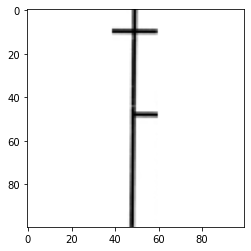

['RC049' 'RC050' 'RC051' 'RC052' 'RC054' 'RC055' 'RC056' 'RC057' 'RC059'
 'RC060' 'RC061' 'RC062' 'RC063' 'RC065' 'RC066' 'RC069' 'RC070' 'RC071'
 'RC073' 'RC074' 'RC075' 'RC076' 'RC077' 'RC078' 'RC079' 'RC082' 'RC083'
 'RC084' 'RC085' 'RC086' 'RC087' 'RC088' 'RC089' 'RC090' 'RC091' 'RC092'
 'RC093' 'RC094' 'RC095' 'RC096' 'RC097' 'RC099' 'RC100' 'RC101' 'RC102'
 'RC103' 'RC104' 'RC105' 'RC106' 'RC107' 'RC108' 'RC109' 'RC110' 'RC111'
 'RC112' 'RC114' 'RC115' 'RC116' 'RC117' 'RC120' 'RC121' 'RC122' 'RC123'
 'RC124' 'RC125' 'RC126' 'RC127' 'RC128' 'RC129' 'RC130' 'RC131' 'RC134']
Processed 50 train images
Processed 100 train images
Processed 150 train images
Processed 200 train images
Processed 250 train images
Processed 300 train images
input_image True
anchor True
model True
concatenate True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
2210
2210
2210
16
Epoch 1/30
139/139 [==============================] - 126s 905ms/step - loss: 7.4874 - comput

In [9]:


batch_size = 16
epochs = 30
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
print(os.path.join(template_dir, "cross.png"))
im_template = cv2.imread(os.path.join(template_dir, "cross.png"), cv2.IMREAD_GRAYSCALE)
print(im_template)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,0,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
# for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
#   fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
#   ax1.imshow(show_ones[i], cmap=plt.gray())
#   ax1.set_title("one")
#   ax2.imshow(show_twos[i], cmap=plt.gray())
#   ax2.set_title("two")
#   plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
# for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
#   fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
#   ax1.imshow(show_ones[i], cmap=plt.gray())
#   ax1.set_title("one_test")
#   ax2.imshow(show_twos[i], cmap=plt.gray())
#   ax2.set_title("two_test")
#   plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.

# create arrays with copies of the template image, for training and validation
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))

# reshape input if channels mentioned
if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)


# Train the model
if train_flag == True:
  # create the base ResNet network, with all layers trainable and without header, to which we set the input shape
  base_network = create_base_network(input_shape, embedding_size)
  
  # input layer for images
  input_images = Input(shape=input_shape, name='input_image')
  # input layer for anchors
  input_anchor = Input(shape=input_shape, name='anchor')
  
  # Generate the networks for feature selection for both images and anchors,
  # that have as output the embeddings in 1024 dimensions
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  # Concatenate the 2 outputs
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, anchors) and outputs the embeddings concatenated above
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)             
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # choose optimiser. RMS is good too!
  opt = Adam(lr=0.0001)  
  #opt = RMSprop()

  # compile the model, with the loss and accuracy defined above
  # batch_hard_triplet_loss - Build the triplet loss over a batch of embeddings. 
  #                           For each anchor, we get the hardest positive and hardest negative to form a triplet.
  #                           Triplet loss after formula in thesis
  # compute_accuracy_hard - Find the hardest positive and the hardest negative as above
  #                         

  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
  
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_cross_transfer_excluded{}_2.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))

  print(len(x_train))
  print(len(y_train))
  print(len(im_template_train))
  print(batch_size)

  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)


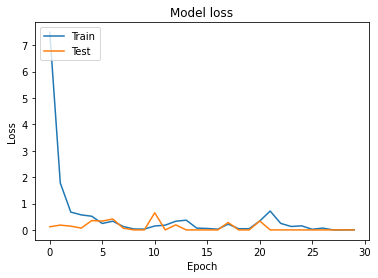

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:57: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:58: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


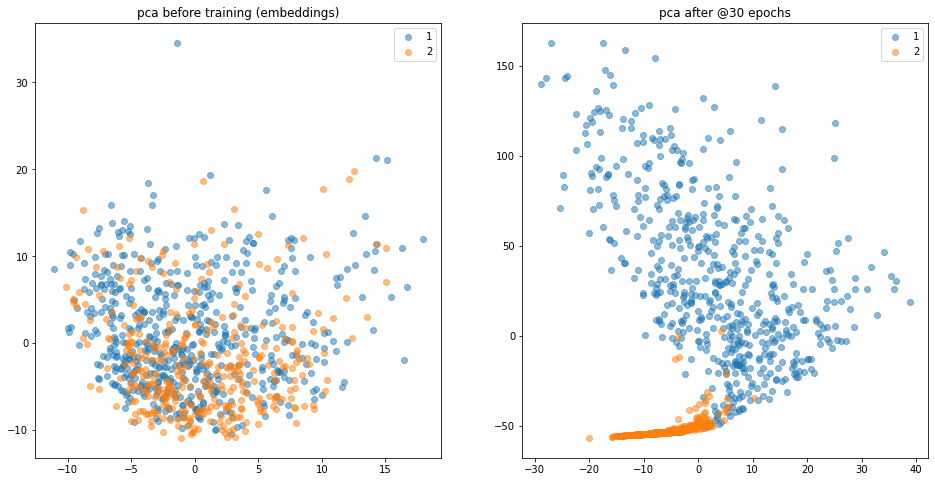

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:90: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:93: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


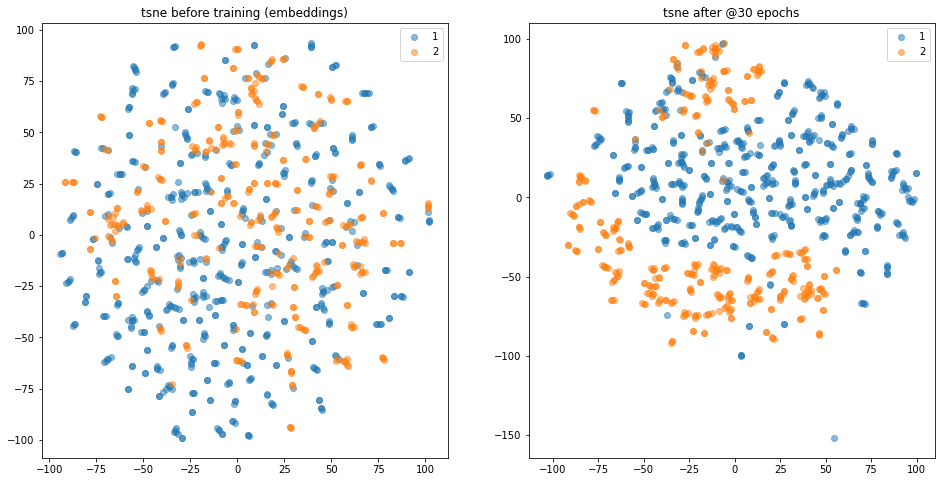

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:90: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:93: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


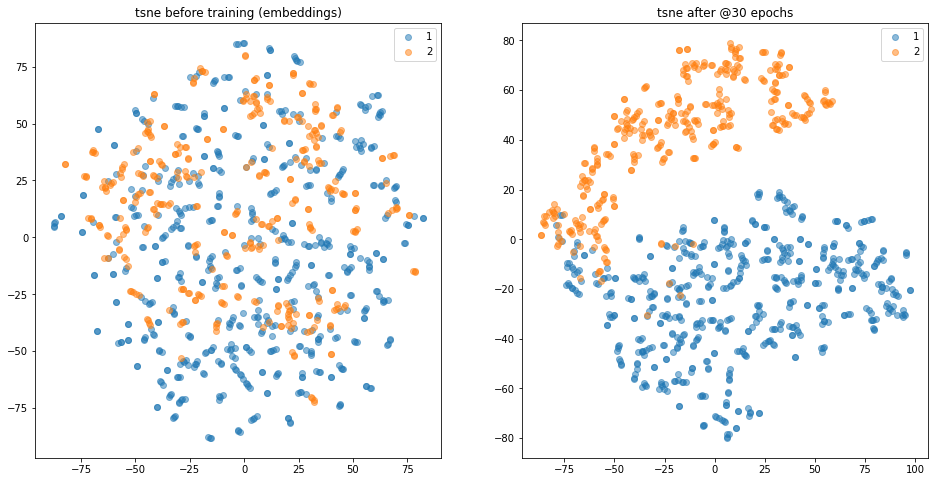

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:90: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:93: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


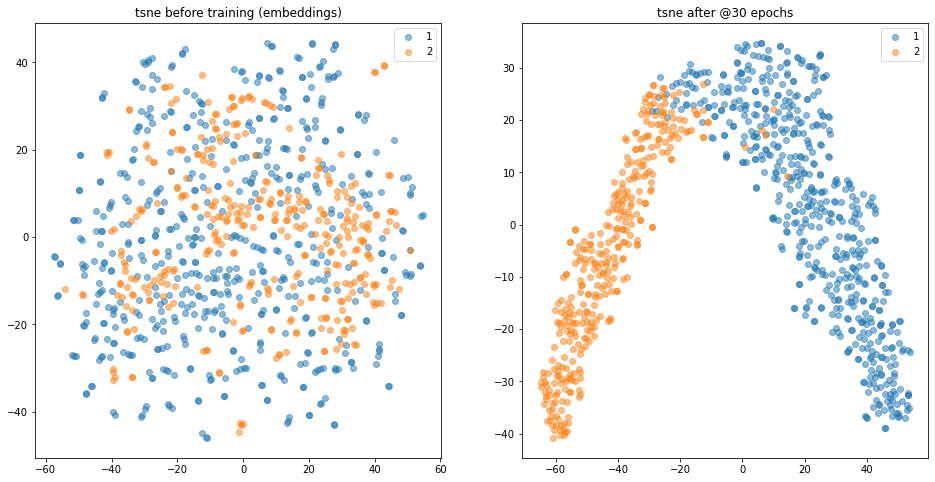

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:90: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:93: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


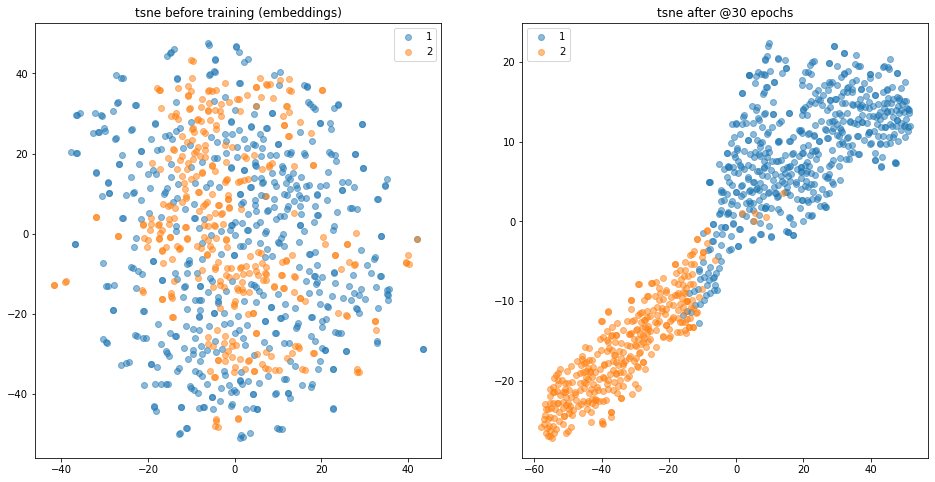

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:90: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:93: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


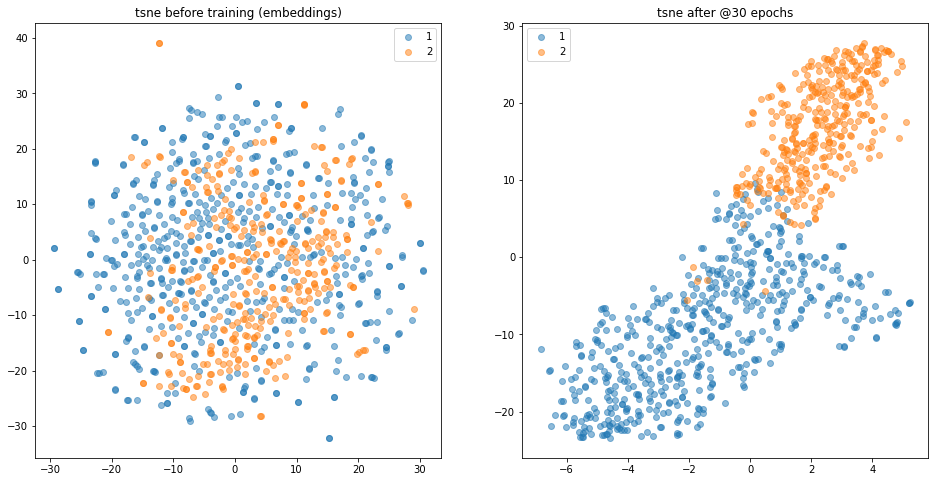

In [10]:

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# For the testing (validation) samples, we want to create the embeddings and see (visualize) the results
# Create the base network for feature selection (generting embeddings)
testing_embeddings = create_base_network(input_shape, embedding_size)
# Predict the embeddings of the validation samples before training!
x_embeddings_before_train = testing_embeddings.predict(
    np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
# Load the model that was just trained
model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                            'compute_accuracy_hard': compute_accuracy_hard})
# Copy the weights from the trained model inside layers, to the newly created base network
for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
    weights = layer_source.get_weights()
    layer_target.set_weights(weights)
    del weights

# predict the embeddings after loading the trained weights
x_embeddings = testing_embeddings.predict(
    np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
dict_embeddings = {}
dict_gray = {}
# identify the classes present in the test set
test_class_labels = np.unique(np.array(y_test))
# no. of components for the PCA visualization
no_of_components = 2
# Create the PCA with the no. of components set above
pca = PCA(n_components=no_of_components)
# Fit the embeddings from multi-dimensional to 2-dimensional
decomposed_embeddings = pca.fit_transform(x_embeddings)
# Fit the embeddings before training from multi-dimensional to 2-dimensional
decomposed_gray = pca.fit_transform(x_embeddings_before_train)
colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

fig = plt.figure(figsize=(16, 8))
# For each label
for label in test_class_labels:
    # Select the elements in the test label array corresponding to the current label
    mask = [y_test==label]
    '''
    #mask1 = np.logical_and(y_test == label, scores_test==0)
    #mask2 = np.logical_and(y_test == label, scores_test==1)
    #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
    #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
    #decomposed_gray_class1 = decomposed_gray[mask1]
    #decomposed_gray_class2 = decomposed_gray[mask2]
    '''
    # Get the embeddings after and before training for the current label
    decomposed_embeddings_class = decomposed_embeddings[mask]
    decomposed_gray_class = decomposed_gray[mask]

    # Plot the current label's points in 2D 

    plt.subplot(1, 2, 1)
    plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
    #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
    plt.title('pca before training (embeddings)')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
    #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
    plt.title('pca after @%d epochs' % epochs)
    plt.legend()

plt.show()
plt.close('all')

# For each perplexity in the array
for i in [2, 5, 30, 50, 100]:
    # TODO: UNDERSTAND
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
        mask = [y_test==label]
        #mask1 = np.logical_and(y_test == label, scores_test==0)
        #mask2 = np.logical_and(y_test == label, scores_test==1)
        #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
        #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
        decomposed_embeddings_class = decomposed_embeddings[mask]
        #decomposed_gray_class1 = decomposed_gray[mask1]
        #decomposed_gray_class2 = decomposed_gray[mask2]
        decomposed_gray_class = decomposed_gray[mask]

        plt.subplot(1, 2, 1)
        plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
        #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
        plt.title('tsne before training (embeddings)')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
        #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
        plt.title('tsne after @%d epochs' % epochs)
        plt.legend()
    plt.show()
    plt.close('all')

# TEMPLATE 6: HORIZONTAL CROSS


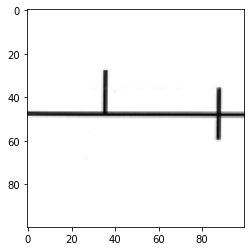

['RC049' 'RC050' 'RC051' 'RC052' 'RC054' 'RC055' 'RC056' 'RC057' 'RC059'
 'RC060' 'RC061' 'RC062' 'RC063' 'RC065' 'RC066' 'RC069' 'RC070' 'RC071'
 'RC073' 'RC074' 'RC075' 'RC076' 'RC077' 'RC078' 'RC079' 'RC082' 'RC083'
 'RC084' 'RC085' 'RC086' 'RC087' 'RC088' 'RC089' 'RC090' 'RC091' 'RC092'
 'RC093' 'RC094' 'RC095' 'RC096' 'RC097' 'RC099' 'RC100' 'RC101' 'RC102'
 'RC103' 'RC104' 'RC105' 'RC106' 'RC107' 'RC108' 'RC109' 'RC110' 'RC111'
 'RC112' 'RC114' 'RC115' 'RC116' 'RC117' 'RC120' 'RC121' 'RC122' 'RC123'
 'RC124' 'RC125' 'RC126' 'RC127' 'RC128' 'RC129' 'RC130' 'RC131' 'RC134']
input_image True
anchor True
model_3 True
concatenate_1 True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Epoch 1/50


UnboundLocalError: local variable 'logs' referenced before assignment

In [ ]:
batch_size = 32
epochs = 50
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
# TODO: crossdown.png does not exist. is it cross.png? it should be cro
im_template = cv2.imread(os.path.join(template_dir, "cross_vert.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,6,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))

if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)


if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!


  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])

  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_crossdown_transfer_excluded{}_2.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)

# save model after each epoch ends if they have better training loss and validation loss than the current best print("line1: " + line1_v)
  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

# TEMPLATE 1: FACE


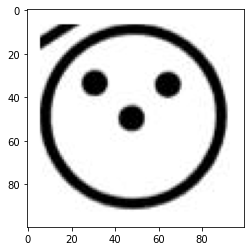

['RC049' 'RC050' 'RC051' 'RC052' 'RC054' 'RC055' 'RC056' 'RC057' 'RC059'
 'RC060' 'RC061' 'RC062' 'RC063' 'RC065' 'RC066' 'RC069' 'RC070' 'RC071'
 'RC073' 'RC074' 'RC075' 'RC076' 'RC077' 'RC078' 'RC079' 'RC082' 'RC083'
 'RC084' 'RC085' 'RC086' 'RC087' 'RC088' 'RC089' 'RC090' 'RC091' 'RC092'
 'RC093' 'RC094' 'RC095' 'RC096' 'RC097' 'RC099' 'RC100' 'RC101' 'RC102'
 'RC103' 'RC104' 'RC105' 'RC106' 'RC107' 'RC108' 'RC109' 'RC110' 'RC111'
 'RC112' 'RC114' 'RC115' 'RC116' 'RC117' 'RC120' 'RC121' 'RC122' 'RC123'
 'RC124' 'RC125' 'RC126' 'RC127' 'RC128' 'RC129' 'RC130' 'RC131' 'RC134']
Processed 50 train images
Processed 100 train images
Processed 150 train images
Processed 200 train images
Processed 250 train images
Processed 300 train images


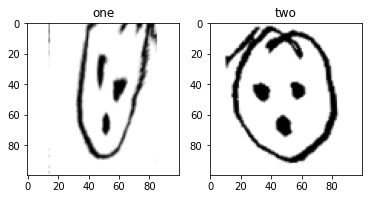

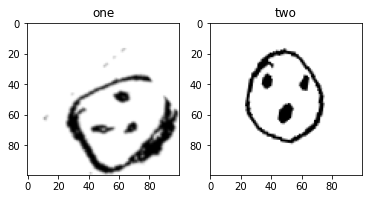

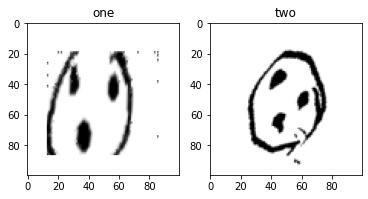

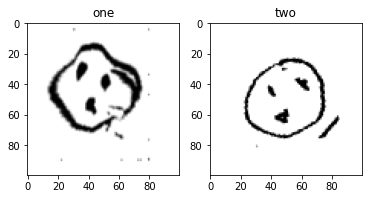

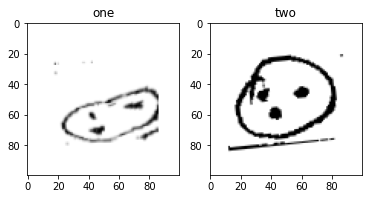

...

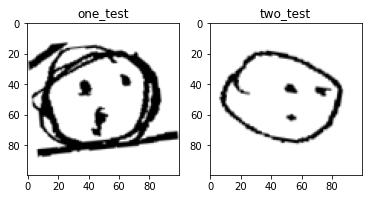

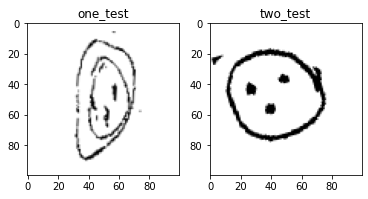

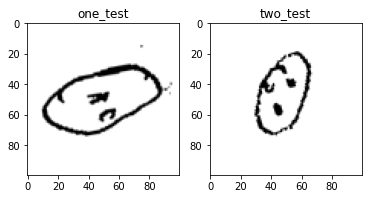

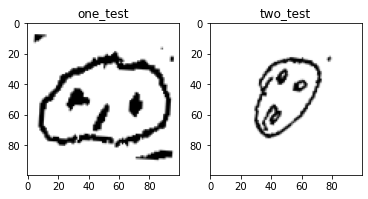

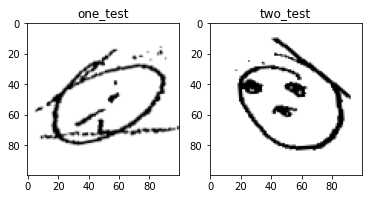

input_image True
anchor True
model True
concatenate True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Epoch 1/30
94/94 [==============================] - 131s 1s/step - loss: 8.2665 - compute_accuracy_hard: 0.1223 - val_loss: 0.5076 - val_compute_accuracy_hard: nan
Epoch 2/30
94/94 [==============================] - 121s 1s/step - loss: 1.9402 - compute_accuracy_hard: 0.3697 - val_loss: 0.2252 - val_compute_accuracy_hard: nan
Epoch 3/30
94/94 [==============================] - 119s 1s/step - loss: 0.6798 - compute_accuracy_hard: 0.7871 - val_loss: 2.0846e-04 - val_compute_accuracy_hard: nan
Epoch 4/30
94/94 [==============================] - 124s 1s/step - loss: 0.5529 - compute_accuracy_hard: 0.8965 - val_loss: 0.0000e+00 - val_compute_accuracy_hard: nan
Epoch 5/30
94/94 [==============================] - 121s 1s/step - loss: 0.4829 - compute_accuracy_hard: 0.9376 - val_loss: 0.0000e+00 - val_compute_accuracy_hard: nan
Epoch 6/30
94/94 [=======

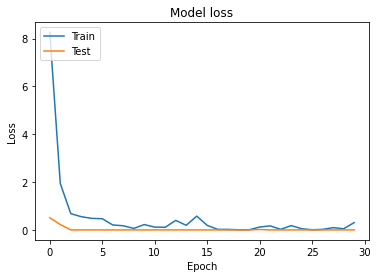

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:171: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:174: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


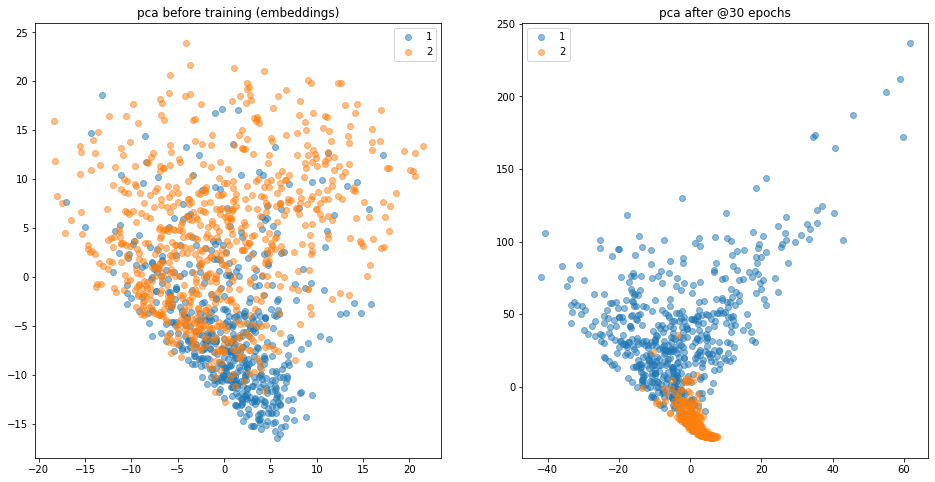

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:202: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:205: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:202: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(

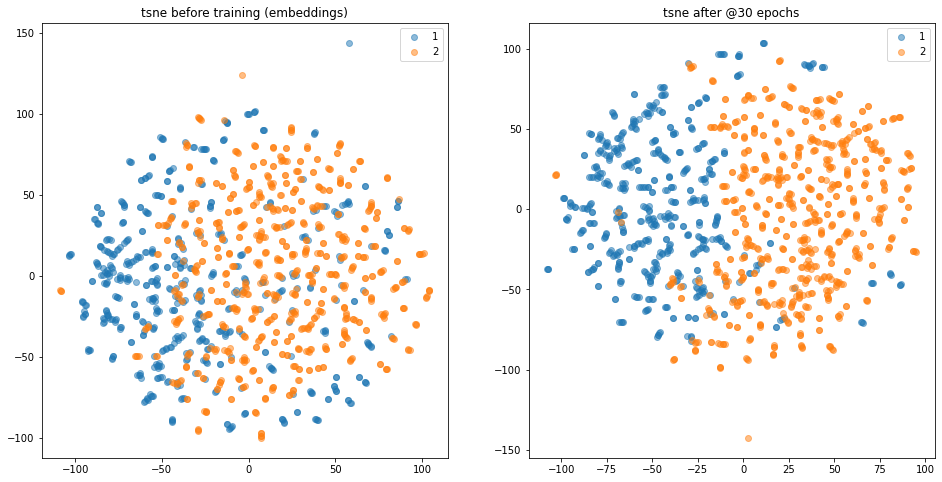

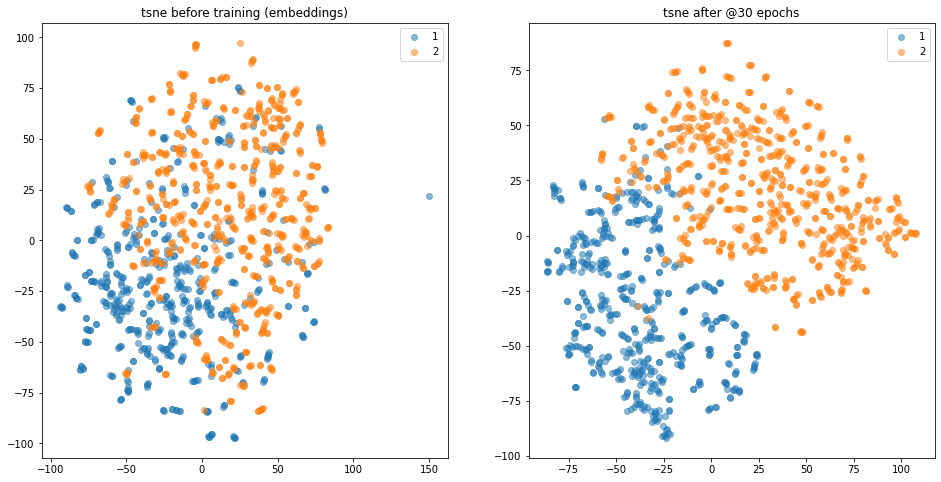

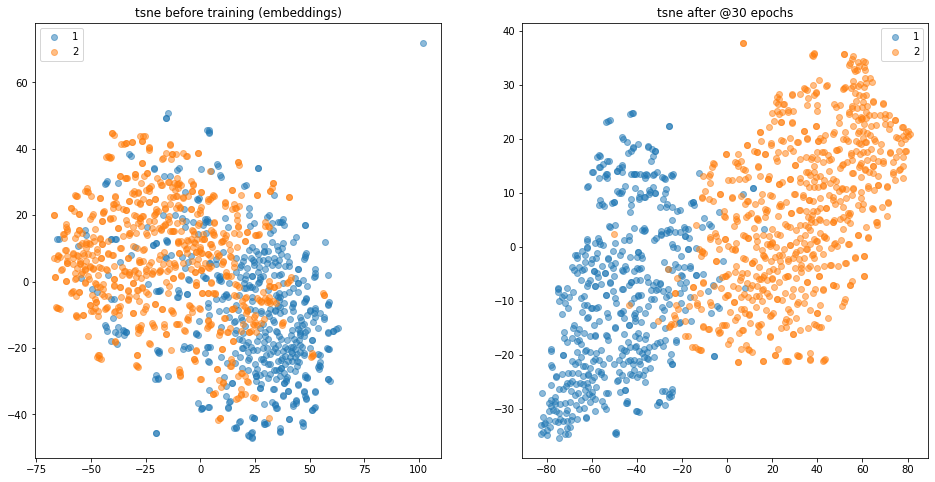

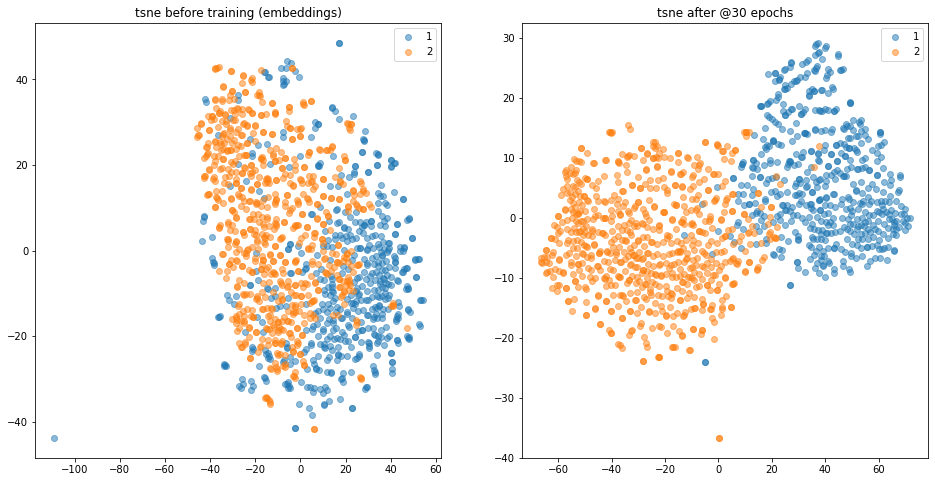

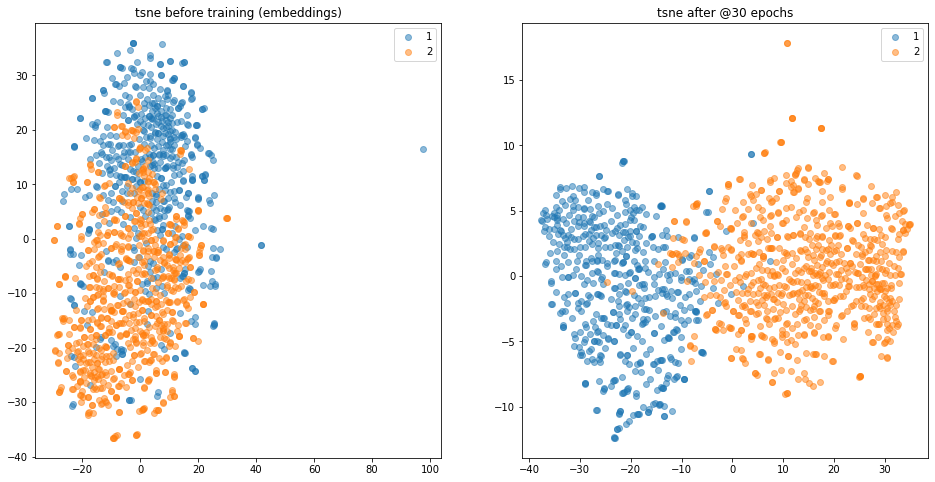

In [7]:

batch_size = 32
epochs = 30
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "face.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,1,True,excluded, heavy_augment_on_positives=True)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))

if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)


if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!


  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])

  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_face_transfer_excluded{}_2.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

# TEMPLATE 2: RAILS

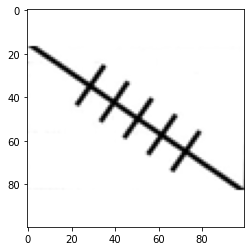

['RC049' 'RC050' 'RC051' 'RC052' 'RC054' 'RC055' 'RC056' 'RC057' 'RC059'
 'RC060' 'RC061' 'RC062' 'RC063' 'RC065' 'RC066' 'RC069' 'RC070' 'RC071'
 'RC073' 'RC074' 'RC075' 'RC076' 'RC077' 'RC078' 'RC079' 'RC082' 'RC083'
 'RC084' 'RC085' 'RC086' 'RC087' 'RC088' 'RC089' 'RC090' 'RC091' 'RC092'
 'RC093' 'RC094' 'RC095' 'RC096' 'RC097' 'RC099' 'RC100' 'RC101' 'RC102'
 'RC103' 'RC104' 'RC105' 'RC106' 'RC107' 'RC108' 'RC109' 'RC110' 'RC111'
 'RC112' 'RC114' 'RC115' 'RC116' 'RC117' 'RC120' 'RC121' 'RC122' 'RC123'
 'RC124' 'RC125' 'RC126' 'RC127' 'RC128' 'RC129' 'RC130' 'RC131' 'RC134']
Processed 50 train images
Processed 100 train images
Processed 150 train images
Processed 200 train images
Processed 250 train images
Processed 300 train images


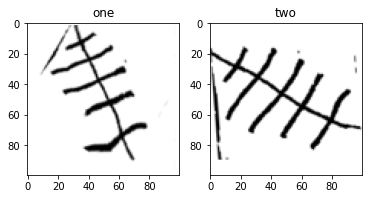

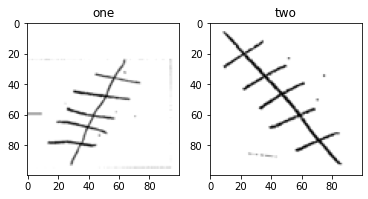

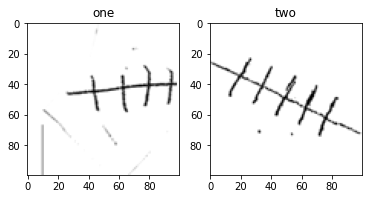

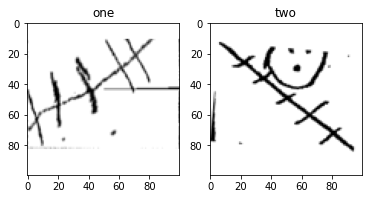

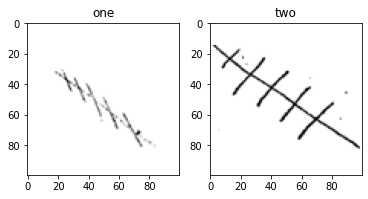

...

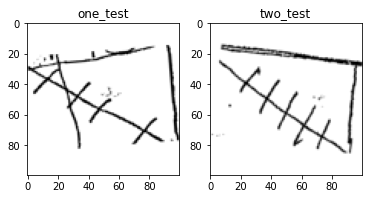

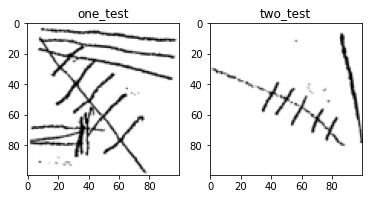

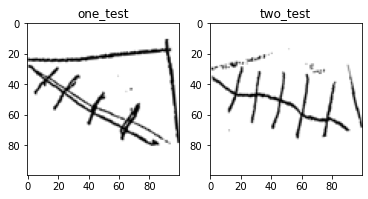

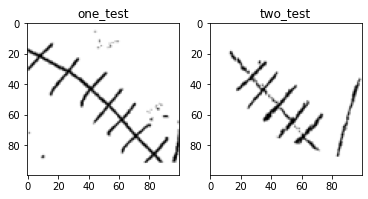

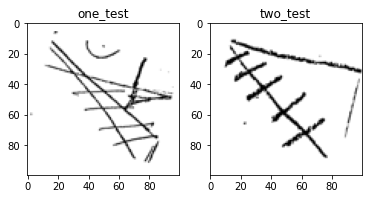

input_image True
anchor True
model True
concatenate True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
3029
3029
3029
Epoch 1/30
95/95 [==============================] - 138s 1s/step - loss: 10.8326 - compute_accuracy_hard: 0.0136 - val_loss: 0.0000e+00 - val_compute_accuracy_hard: nan
Epoch 2/30
95/95 [==============================] - 130s 1s/step - loss: 3.4493 - compute_accuracy_hard: 0.0624 - val_loss: 0.0000e+00 - val_compute_accuracy_hard: nan
Epoch 3/30
95/95 [==============================] - 132s 1s/step - loss: 1.2392 - compute_accuracy_hard: 0.0675 - val_loss: 0.0000e+00 - val_compute_accuracy_hard: nan
Epoch 4/30
95/95 [==============================] - 127s 1s/step - loss: 0.8600 - compute_accuracy_hard: 0.1214 - val_loss: 0.0000e+00 - val_compute_accuracy_hard: nan
Epoch 5/30
95/95 [==============================] - 127s 1s/step - loss: 0.6182 - compute_accuracy_hard: 0.6124 - val_loss: 0.0000e+00 - val_compute_accuracy_hard: nan
E

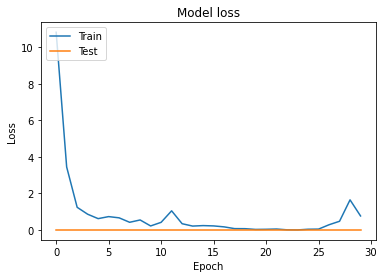

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:176: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:179: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


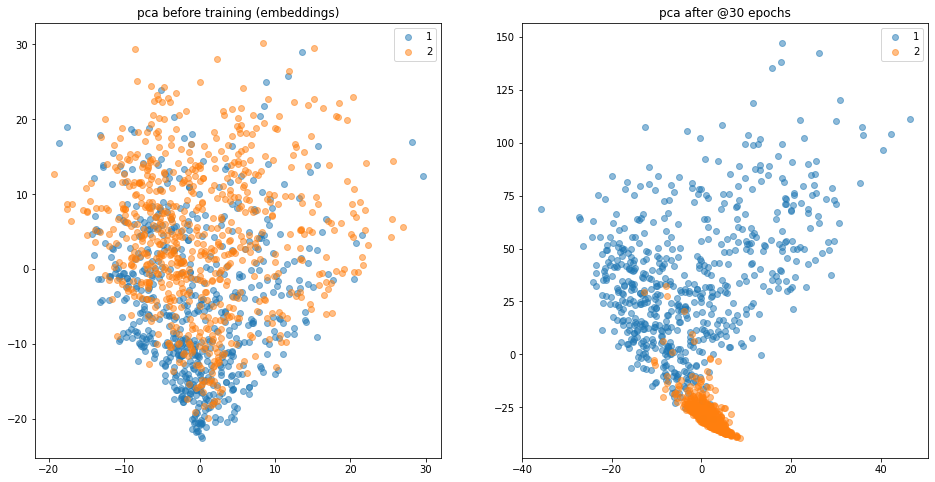

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:207: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:210: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:207: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(

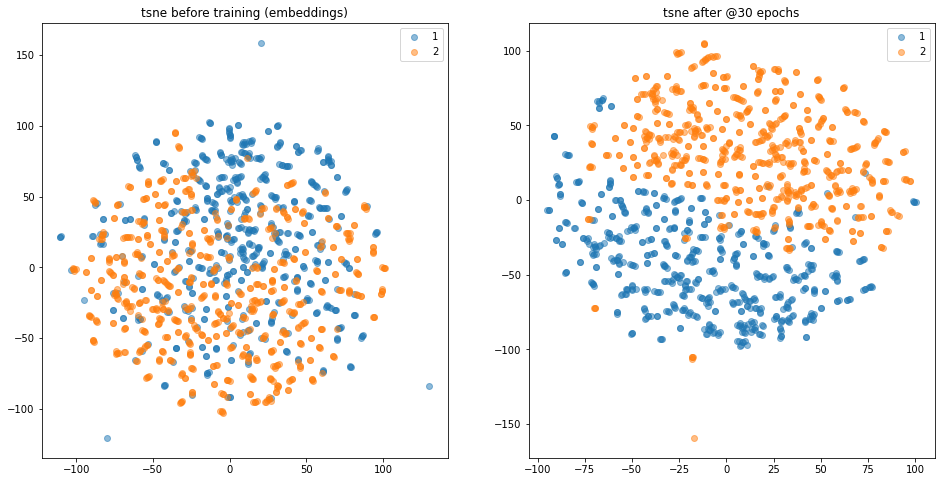

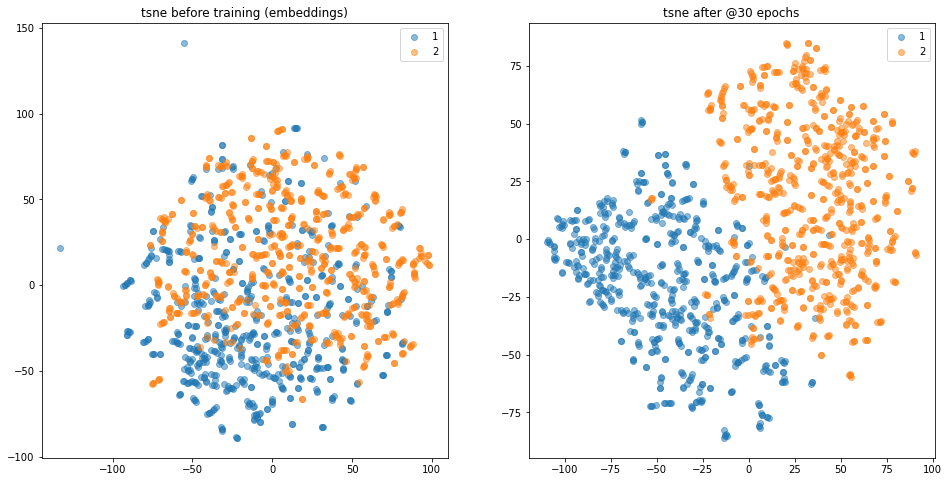

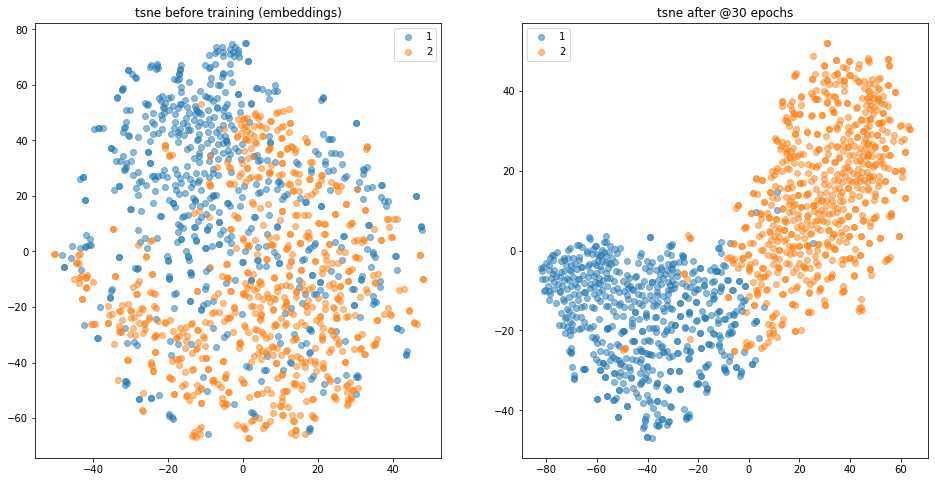

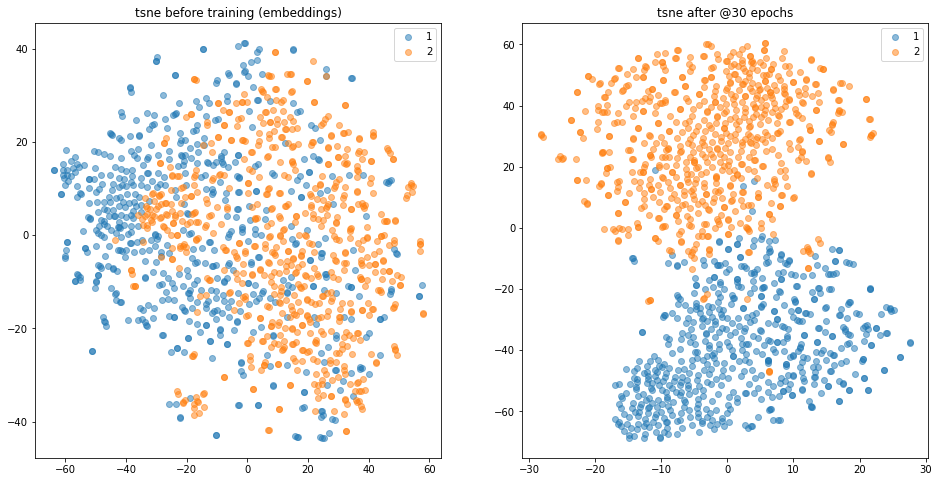

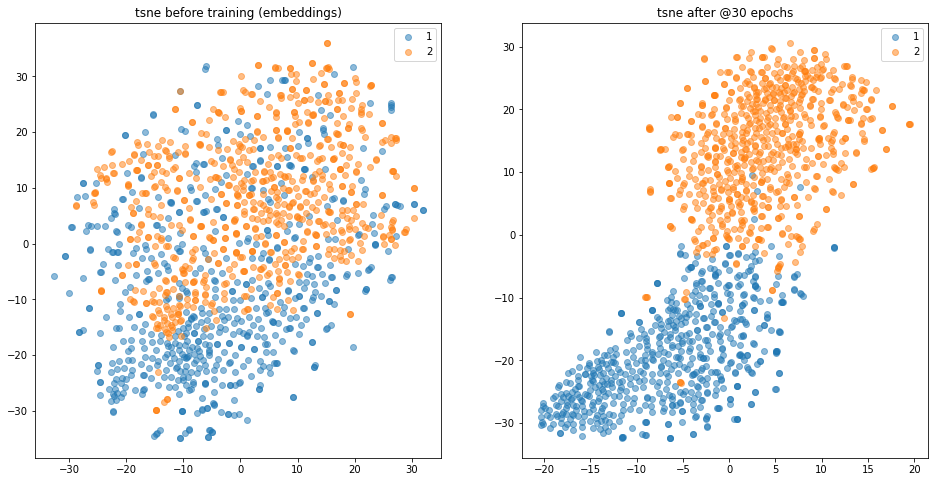

In [6]:
batch_size = 32
epochs = 30
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1


root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "rail.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,2,True,excluded, heavy_augment_on_positives=True)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))

if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)


if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!


  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])

  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_rail_transfer_excluded{}_.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]
  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))

  print(len(x_train))
  print(len(y_train))
  print(len(im_template_train))

  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

# TEMPLATE 3: RHOMB

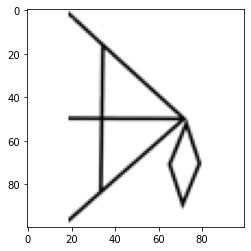

['RC049' 'RC050' 'RC051' 'RC052' 'RC054' 'RC055' 'RC056' 'RC057' 'RC059'
 'RC060' 'RC061' 'RC062' 'RC063' 'RC065' 'RC066' 'RC069' 'RC070' 'RC071'
 'RC073' 'RC074' 'RC075' 'RC076' 'RC077' 'RC078' 'RC079' 'RC082' 'RC083'
 'RC084' 'RC085' 'RC086' 'RC087' 'RC088' 'RC089' 'RC090' 'RC091' 'RC092'
 'RC093' 'RC094' 'RC095' 'RC096' 'RC097' 'RC099' 'RC100' 'RC101' 'RC102'
 'RC103' 'RC104' 'RC105' 'RC106' 'RC107' 'RC108' 'RC109' 'RC110' 'RC111'
 'RC112' 'RC114' 'RC115' 'RC116' 'RC117' 'RC120' 'RC121' 'RC122' 'RC123'
 'RC124' 'RC125' 'RC126' 'RC127' 'RC128' 'RC129' 'RC130' 'RC131' 'RC134']
Processed 50 train images
Processed 100 train images
Processed 150 train images
Processed 200 train images
Processed 250 train images
Processed 300 train images


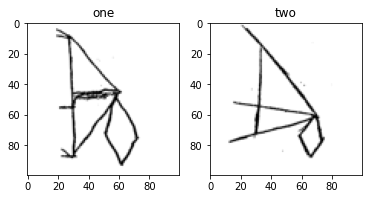

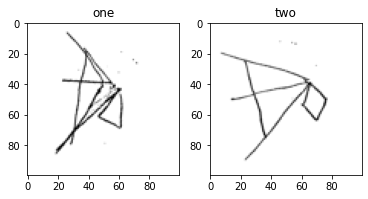

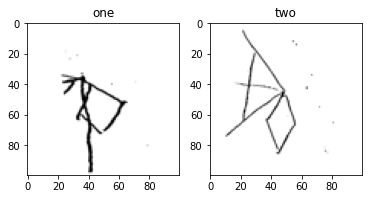

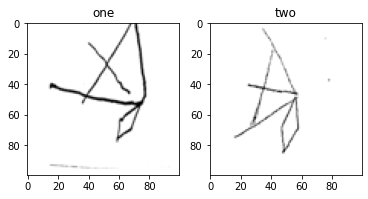

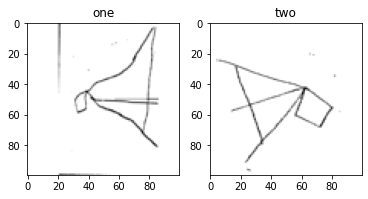

...

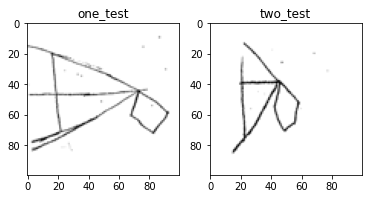

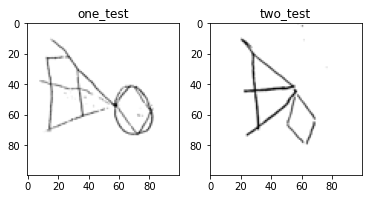

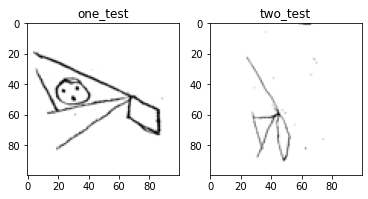

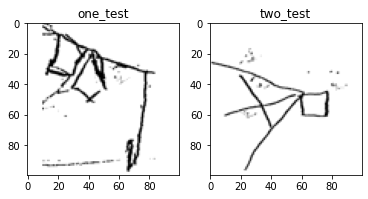

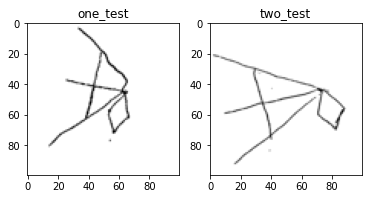

input_image True
anchor True
model True
concatenate True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Epoch 1/30
99/99 [==============================] - 149s 2s/step - loss: 6.8361 - compute_accuracy_hard: 0.0217 - val_loss: 0.2272 - val_compute_accuracy_hard: nan
Epoch 2/30
99/99 [==============================] - 118s 1s/step - loss: 1.3587 - compute_accuracy_hard: 0.0515 - val_loss: 0.3719 - val_compute_accuracy_hard: nan
Epoch 3/30
99/99 [==============================] - 117s 1s/step - loss: 0.8429 - compute_accuracy_hard: 0.1090 - val_loss: 0.3585 - val_compute_accuracy_hard: nan
Epoch 4/30
99/99 [==============================] - 118s 1s/step - loss: 0.6893 - compute_accuracy_hard: 0.3276 - val_loss: 0.2435 - val_compute_accuracy_hard: nan
Epoch 5/30
99/99 [==============================] - 129s 1s/step - loss: 0.8862 - compute_accuracy_hard: 0.4648 - val_loss: 0.1941 - val_compute_accuracy_hard: nan
Epoch 6/30
99/99 [===================

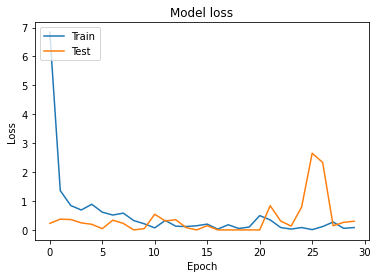

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:173: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:176: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


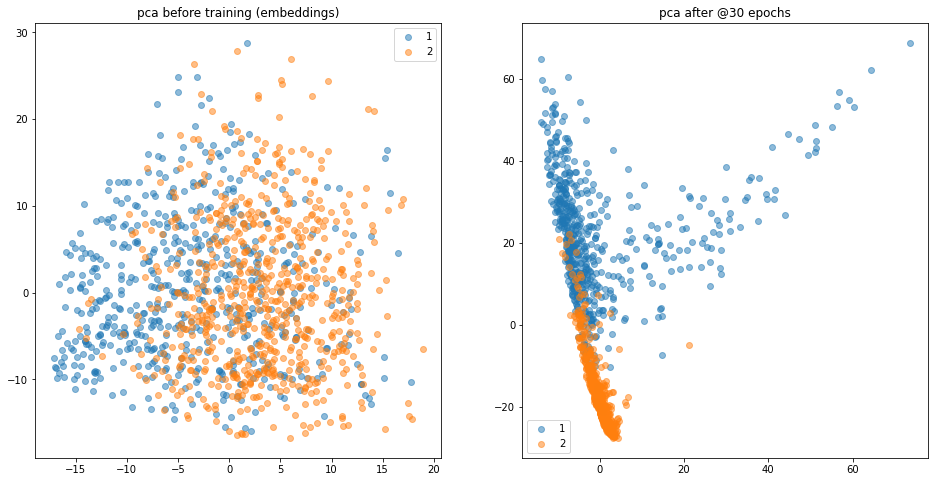

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:204: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:207: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:204: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(

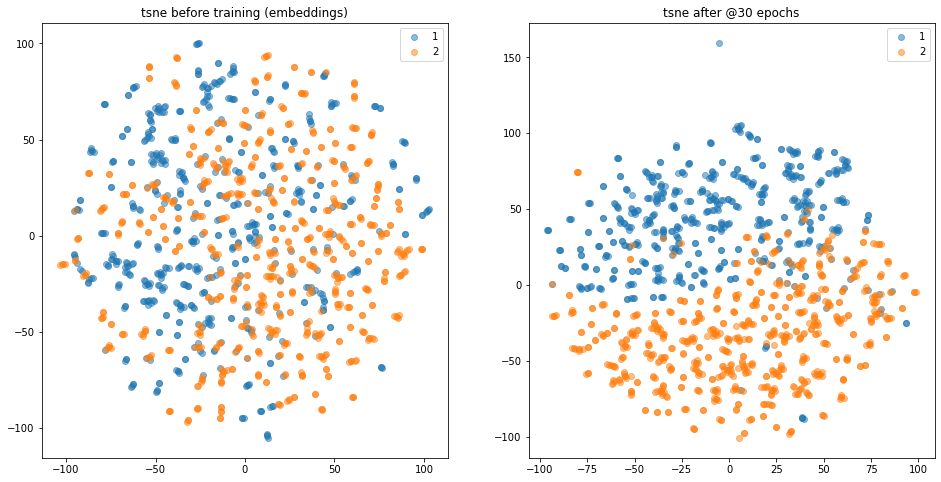

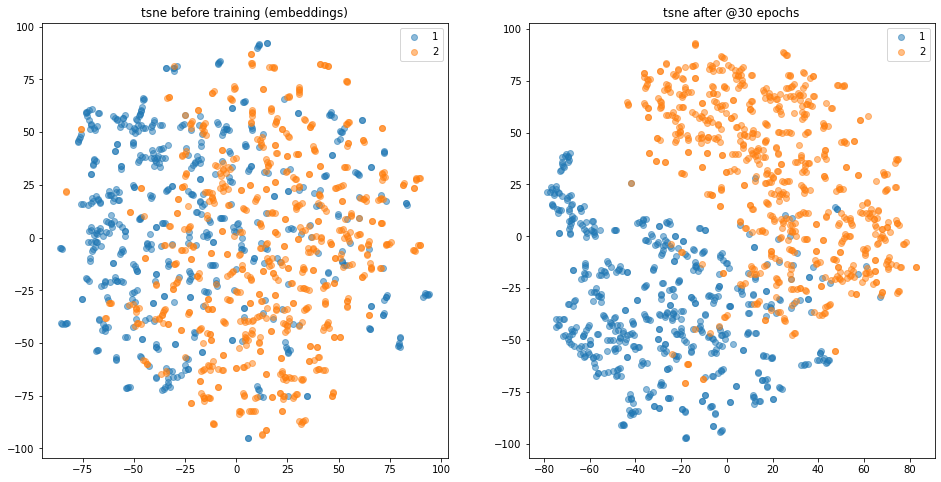

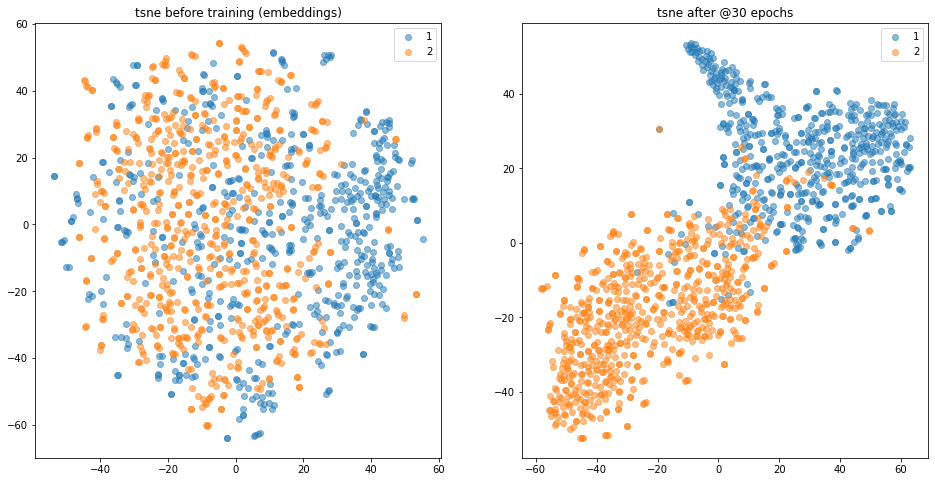

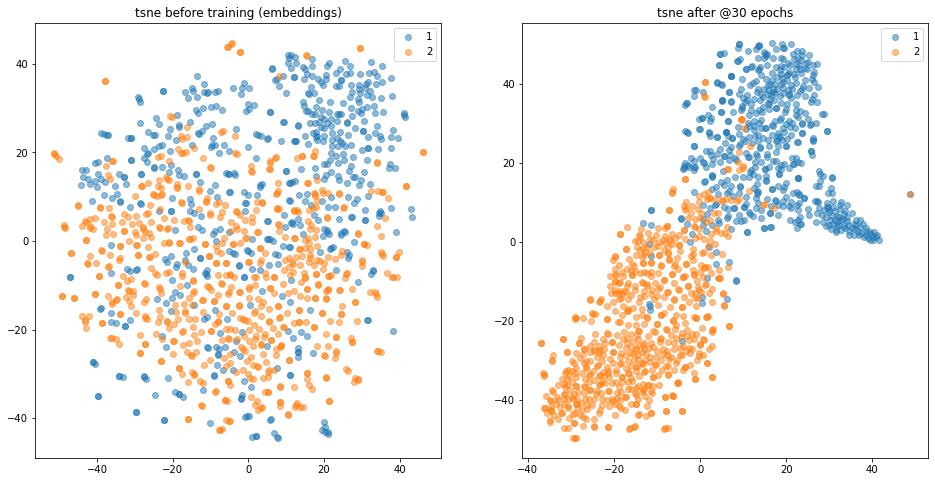

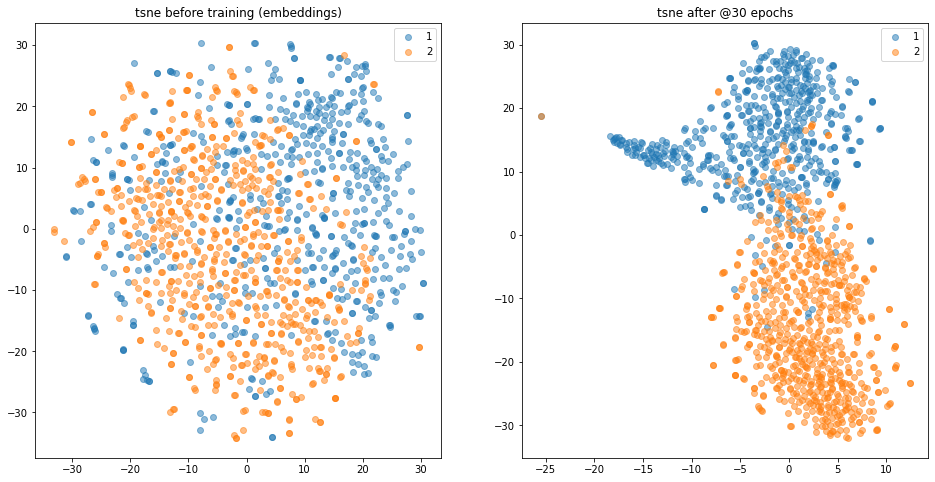

In [8]:
batch_size = 32
epochs = 30
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1
 
root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "rombo.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''
 
im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')
 
# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,3,True,excluded, heavy_augment_on_positives=True)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()
 
show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))
 
if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)
 
 
if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)
 
  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings
 
  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)
 
  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!
 
 
  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
 
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_rombo_transfer_excluded{}_2.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)
 
  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]
 
  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))
 
 
 
  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)
 
 
 
# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()
 
  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network
 
  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights
 
  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))
 
  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)
 
  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']
 
  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]
 
      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()
 
      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()
 
  plt.show()
  plt.close('all')
 
  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]
 
      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()
 
      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

# TEMPLATE 4: RETT_DIAG

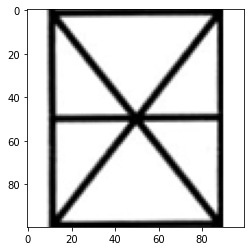

['RC049' 'RC050' 'RC051' 'RC052' 'RC054' 'RC055' 'RC056' 'RC057' 'RC059'
 'RC060' 'RC061' 'RC062' 'RC063' 'RC065' 'RC066' 'RC069' 'RC070' 'RC071'
 'RC073' 'RC074' 'RC075' 'RC076' 'RC077' 'RC078' 'RC079' 'RC082' 'RC083'
 'RC084' 'RC085' 'RC086' 'RC087' 'RC088' 'RC089' 'RC090' 'RC091' 'RC092'
 'RC093' 'RC094' 'RC095' 'RC096' 'RC097' 'RC099' 'RC100' 'RC101' 'RC102'
 'RC103' 'RC104' 'RC105' 'RC106' 'RC107' 'RC108' 'RC109' 'RC110' 'RC111'
 'RC112' 'RC114' 'RC115' 'RC116' 'RC117' 'RC120' 'RC121' 'RC122' 'RC123'
 'RC124' 'RC125' 'RC126' 'RC127' 'RC128' 'RC129' 'RC130' 'RC131' 'RC134']
Processed 50 train images
Processed 100 train images
Processed 150 train images
Processed 200 train images
Processed 250 train images
Processed 300 train images


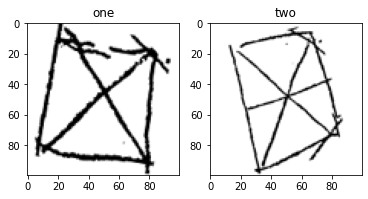

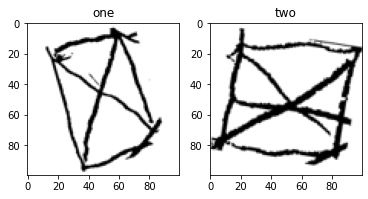

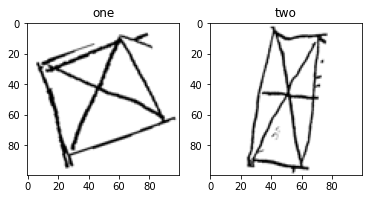

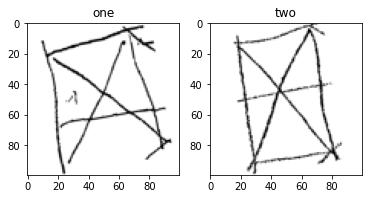

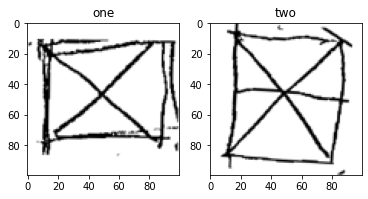

...

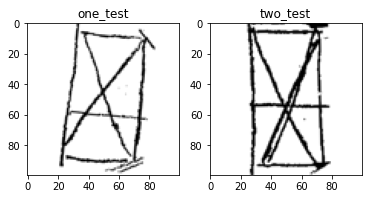

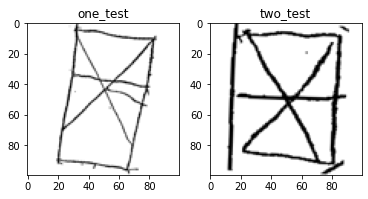

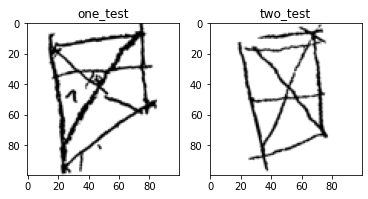

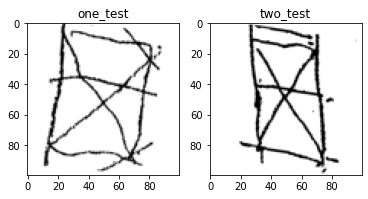

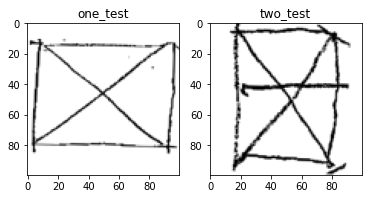

input_image True
anchor True
model_2 True
concatenate_1 True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Epoch 1/25
71/71 [==============================] - 110s 2s/step - loss: 10.3139 - compute_accuracy_hard: 0.0315 - val_loss: 0.7191 - val_compute_accuracy_hard: nan
Epoch 2/25
71/71 [==============================] - 102s 1s/step - loss: 3.5482 - compute_accuracy_hard: 0.1364 - val_loss: 0.1385 - val_compute_accuracy_hard: nan
Epoch 3/25
71/71 [==============================] - 85s 1s/step - loss: 1.5004 - compute_accuracy_hard: 0.3353 - val_loss: 0.1663 - val_compute_accuracy_hard: nan
Epoch 4/25
71/71 [==============================] - 85s 1s/step - loss: 0.7272 - compute_accuracy_hard: 0.7291 - val_loss: 0.2251 - val_compute_accuracy_hard: nan
Epoch 5/25
71/71 [==============================] - 85s 1s/step - loss: 0.5924 - compute_accuracy_hard: 0.8758 - val_loss: 0.2241 - val_compute_accuracy_hard: nan
Epoch 6/25
71/71 [=================

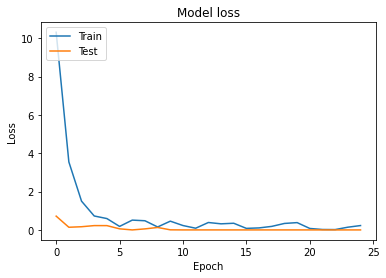

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:178: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:181: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


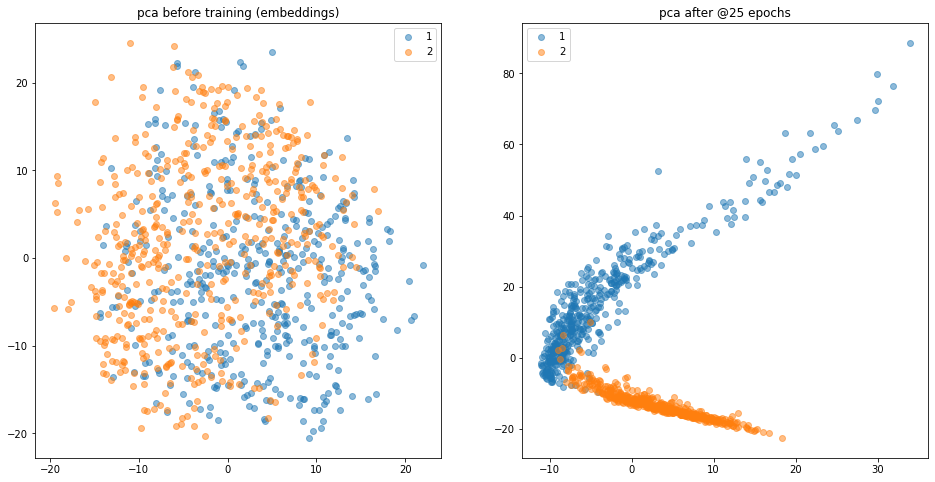

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:209: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:212: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:209: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(

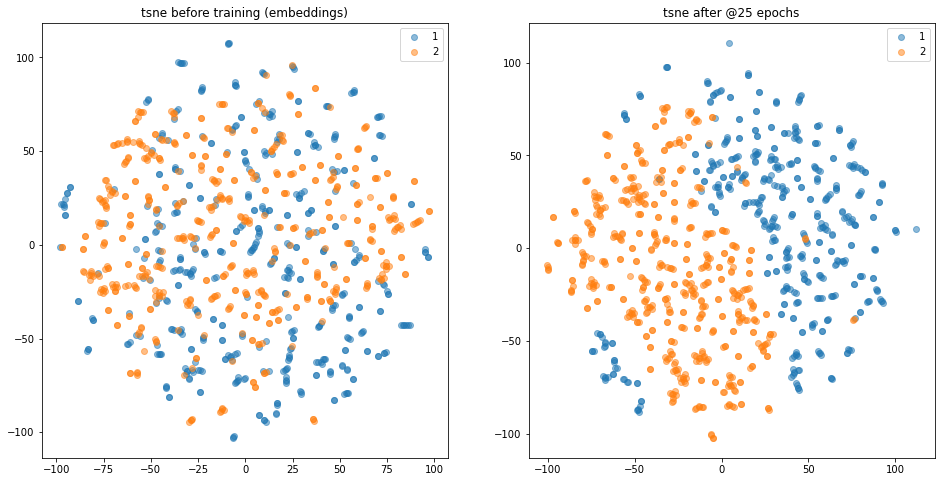

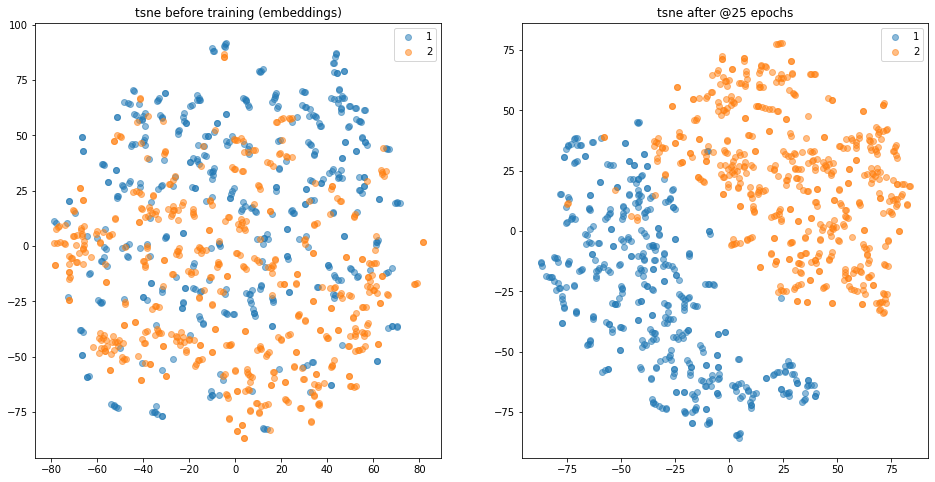

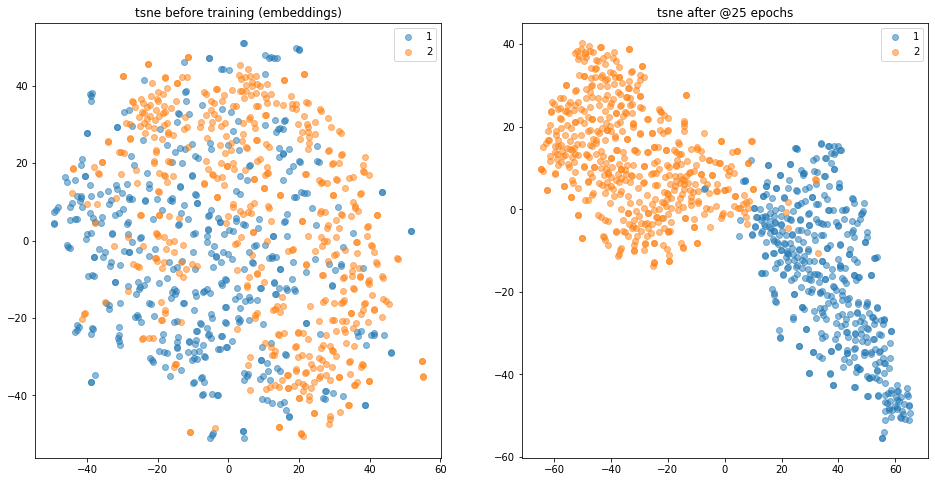

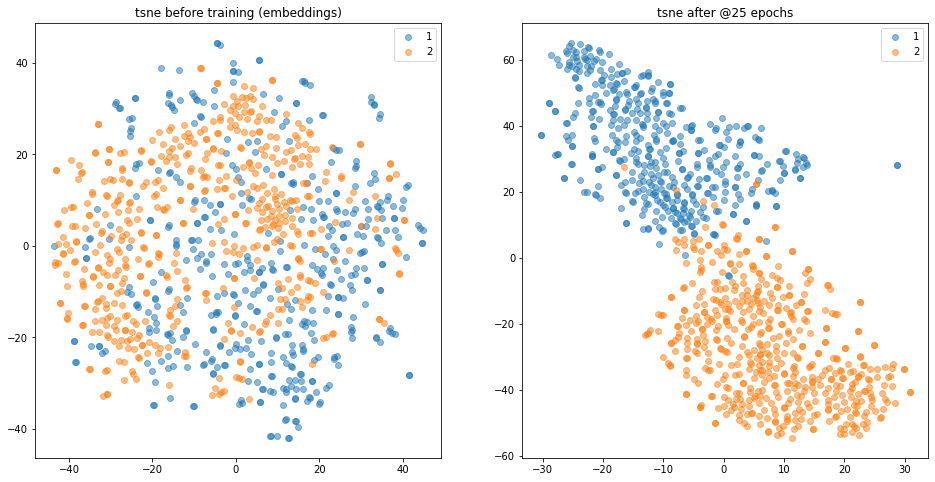

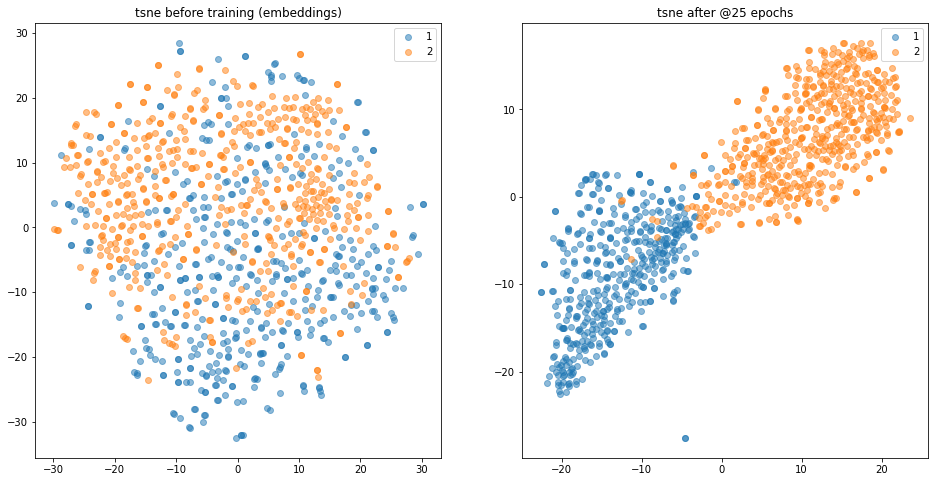

In [7]:
# TODO: train tomorrow
    

batch_size = 32
epochs = 25
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "../"
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "rett_diag.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,4,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))


if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)



if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!
  #opt = RMSprop()

  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
  
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_rett_diag_transfer.hdf5'
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

# TEMPLATE 5: RECT

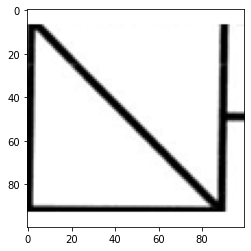

['RC049' 'RC050' 'RC051' 'RC052' 'RC054' 'RC055' 'RC056' 'RC057' 'RC059'
 'RC060' 'RC061' 'RC062' 'RC063' 'RC065' 'RC066' 'RC069' 'RC070' 'RC071'
 'RC073' 'RC074' 'RC075' 'RC076' 'RC077' 'RC078' 'RC079' 'RC082' 'RC083'
 'RC084' 'RC085' 'RC086' 'RC087' 'RC088' 'RC089' 'RC090' 'RC091' 'RC092'
 'RC093' 'RC094' 'RC095' 'RC096' 'RC097' 'RC099' 'RC100' 'RC101' 'RC102'
 'RC103' 'RC104' 'RC105' 'RC106' 'RC107' 'RC108' 'RC109' 'RC110' 'RC111'
 'RC112' 'RC114' 'RC115' 'RC116' 'RC117' 'RC120' 'RC121' 'RC122' 'RC123'
 'RC124' 'RC125' 'RC126' 'RC127' 'RC128' 'RC129' 'RC130' 'RC131' 'RC134']
Processed 50 train images
Processed 100 train images
Processed 150 train images
Processed 200 train images
Processed 250 train images
Processed 300 train images


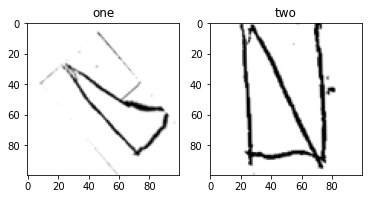

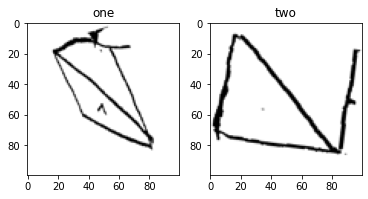

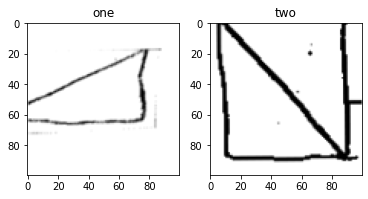

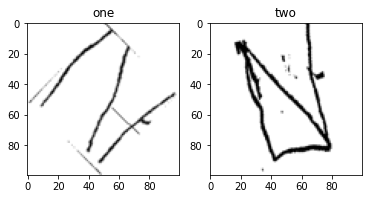

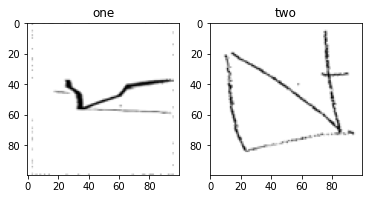

...

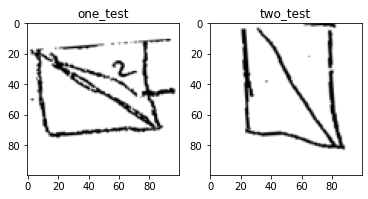

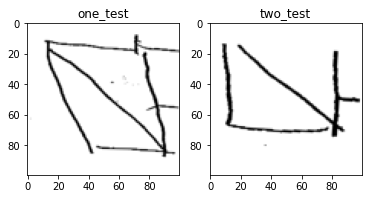

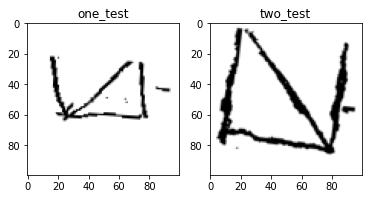

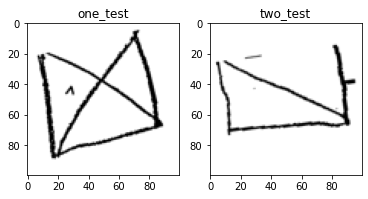

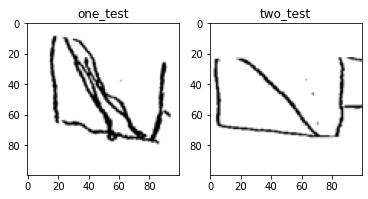

input_image True
anchor True
model True
concatenate True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Epoch 1/30
93/93 [==============================] - 140s 2s/step - loss: 8.4095 - compute_accuracy_hard: 0.0633 - val_loss: 0.3694 - val_compute_accuracy_hard: nan
Epoch 2/30
93/93 [==============================] - 127s 1s/step - loss: 2.0435 - compute_accuracy_hard: 0.3401 - val_loss: 0.3421 - val_compute_accuracy_hard: nan
Epoch 3/30
93/93 [==============================] - 108s 1s/step - loss: 0.7486 - compute_accuracy_hard: 0.7129 - val_loss: 0.4325 - val_compute_accuracy_hard: nan
Epoch 4/30
93/93 [==============================] - 108s 1s/step - loss: 0.2676 - compute_accuracy_hard: 0.9485 - val_loss: 0.5179 - val_compute_accuracy_hard: nan
Epoch 5/30
93/93 [==============================] - 108s 1s/step - loss: 0.2525 - compute_accuracy_hard: 0.9644 - val_loss: 0.7571 - val_compute_accuracy_hard: nan
Epoch 6/30
93/93 [===================

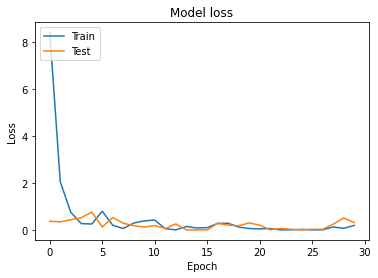

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:175: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:178: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


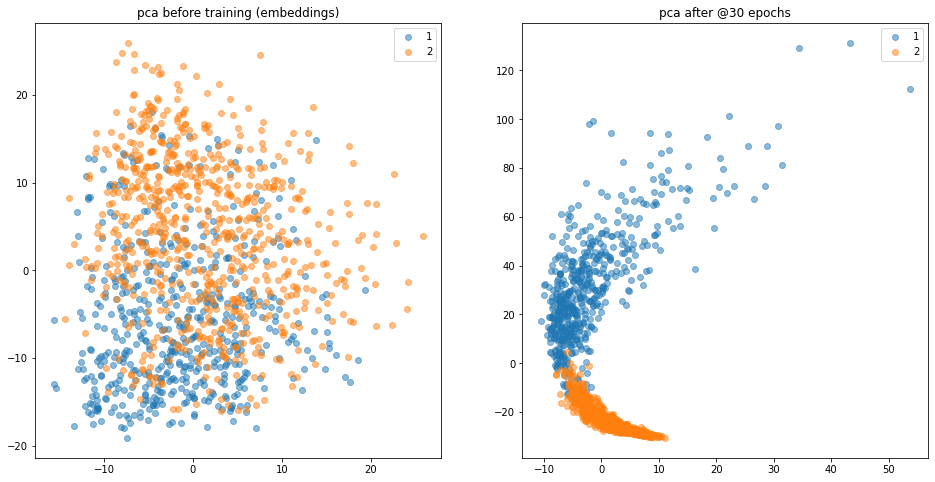

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:206: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:209: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:206: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(

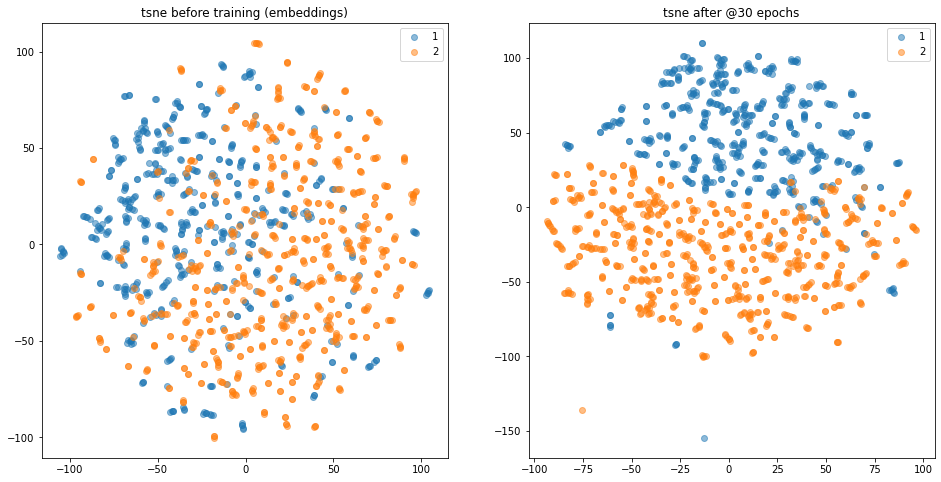

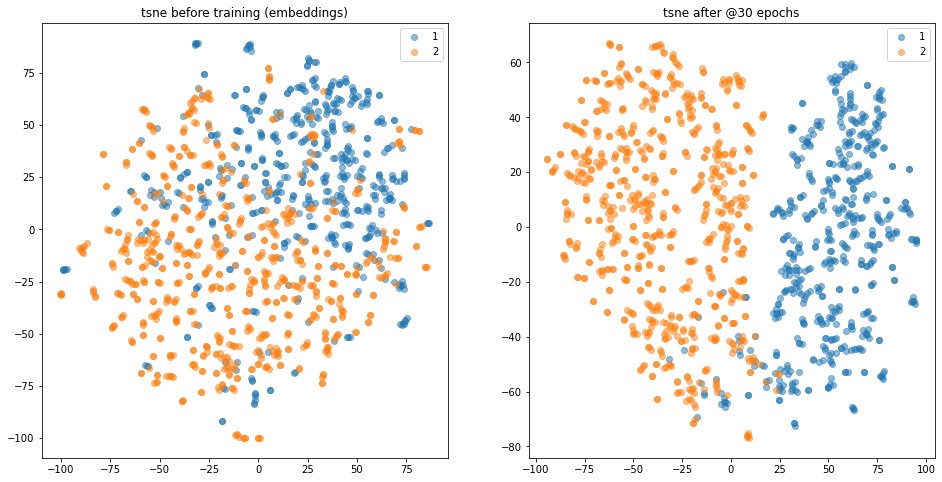

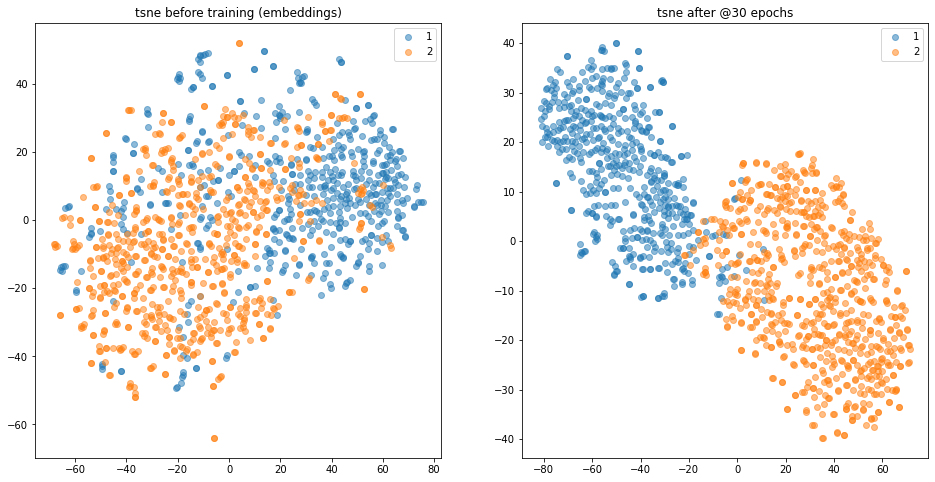

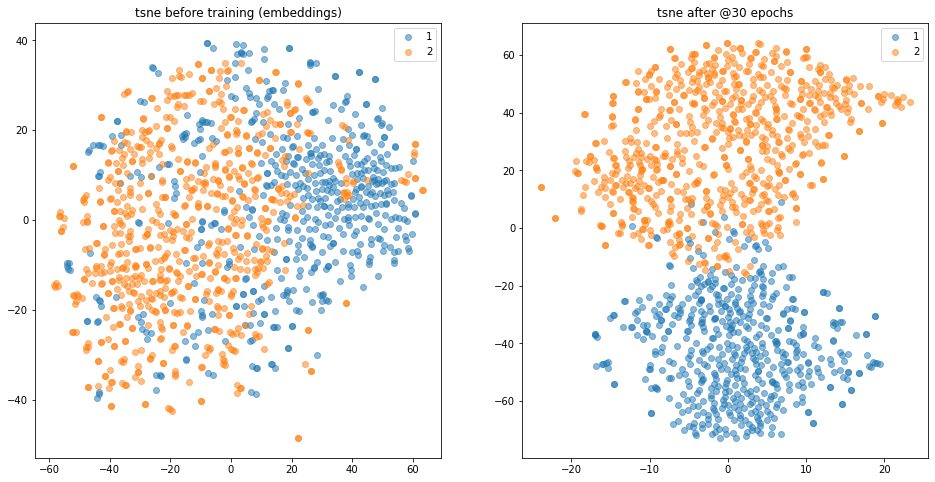

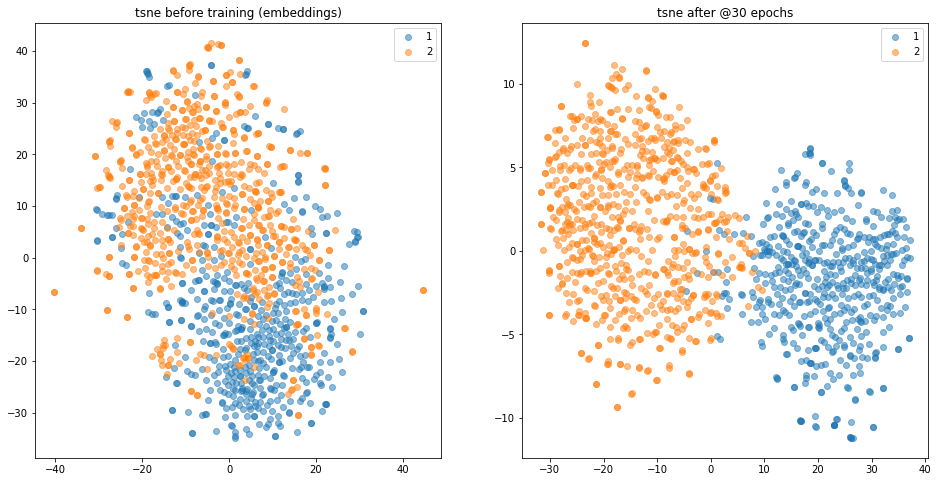

In [6]:

    

batch_size = 32
epochs = 30
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "rect.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,5,True,excluded, heavy_augment_on_positives=True)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))


if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)



if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!
  #opt = RMSprop()

  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
  
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_rect_transfer.hdf5'
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

# TEMPLATE 6: CROSS_VERT

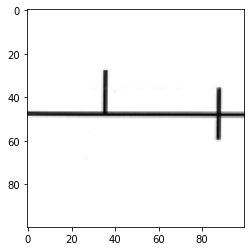

['RC049' 'RC050' 'RC051' 'RC052' 'RC054' 'RC055' 'RC056' 'RC057' 'RC059'
 'RC060' 'RC061' 'RC062' 'RC063' 'RC065' 'RC066' 'RC069' 'RC070' 'RC071'
 'RC073' 'RC074' 'RC075' 'RC076' 'RC077' 'RC078' 'RC079' 'RC082' 'RC083'
 'RC084' 'RC085' 'RC086' 'RC087' 'RC088' 'RC089' 'RC090' 'RC091' 'RC092'
 'RC093' 'RC094' 'RC095' 'RC096' 'RC097' 'RC099' 'RC100' 'RC101' 'RC102'
 'RC103' 'RC104' 'RC105' 'RC106' 'RC107' 'RC108' 'RC109' 'RC110' 'RC111'
 'RC112' 'RC114' 'RC115' 'RC116' 'RC117' 'RC120' 'RC121' 'RC122' 'RC123'
 'RC124' 'RC125' 'RC126' 'RC127' 'RC128' 'RC129' 'RC130' 'RC131' 'RC134']
Processed 50 train images
Processed 100 train images
Processed 150 train images
Processed 200 train images
Processed 250 train images
Processed 300 train images


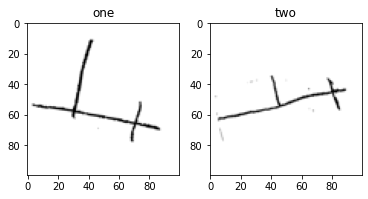

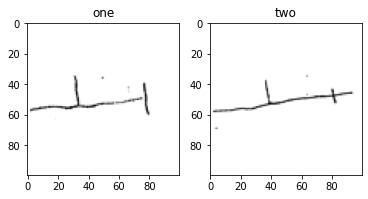

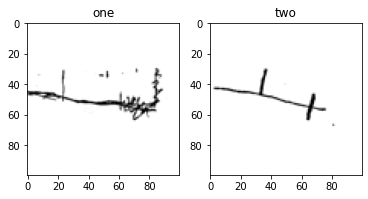

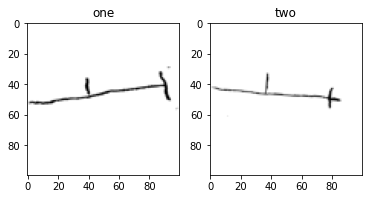

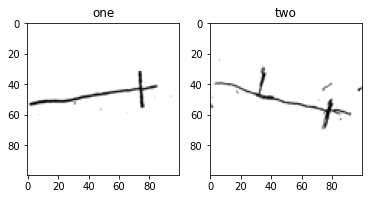

...

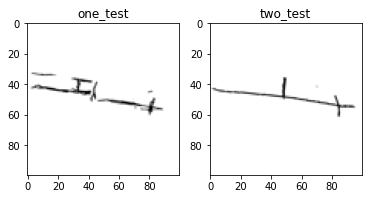

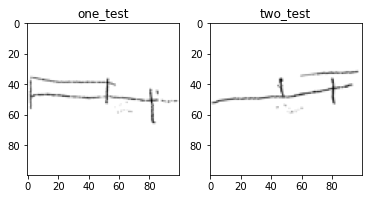

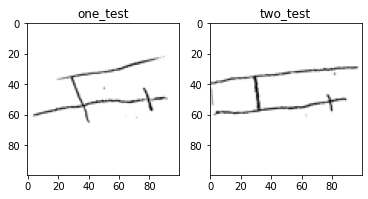

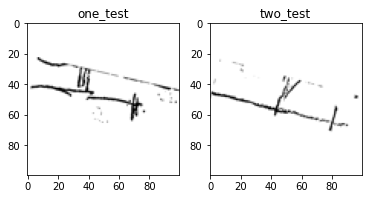

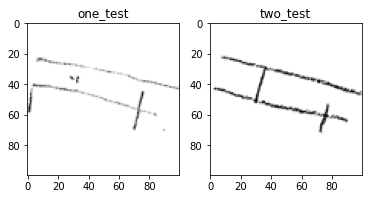

input_image True
anchor True
model True
concatenate True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Epoch 1/30
71/71 [==============================] - 106s 1s/step - loss: 11.6615 - compute_accuracy_hard: 0.0026 - val_loss: 0.3099 - val_compute_accuracy_hard: nan
Epoch 2/30
71/71 [==============================] - 108s 2s/step - loss: 3.4762 - compute_accuracy_hard: 0.0085 - val_loss: 0.1589 - val_compute_accuracy_hard: nan
Epoch 3/30
71/71 [==============================] - 102s 1s/step - loss: 1.1699 - compute_accuracy_hard: 0.0038 - val_loss: 0.1526 - val_compute_accuracy_hard: nan
Epoch 4/30
71/71 [==============================] - 100s 1s/step - loss: 0.8531 - compute_accuracy_hard: 0.0018 - val_loss: 0.1492 - val_compute_accuracy_hard: nan
Epoch 5/30
71/71 [==============================] - 85s 1s/step - loss: 0.7376 - compute_accuracy_hard: 8.2850e-04 - val_loss: 0.1966 - val_compute_accuracy_hard: nan
Epoch 6/30
71/71 [===============

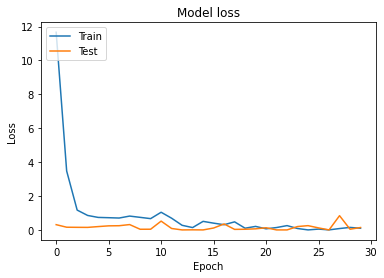

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:175: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:178: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


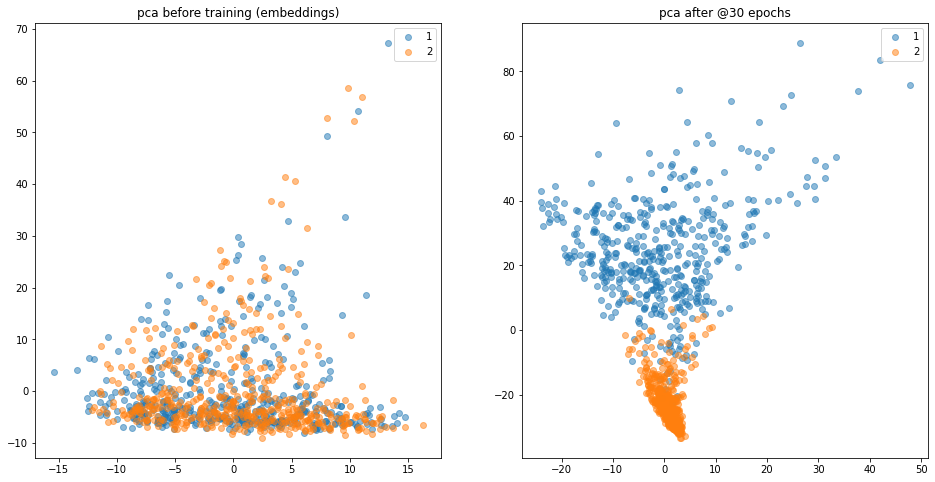

C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:206: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:209: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\aida\anaconda3\envs\rocf2_env\lib\site-packages\ipykernel_launcher.py:206: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(

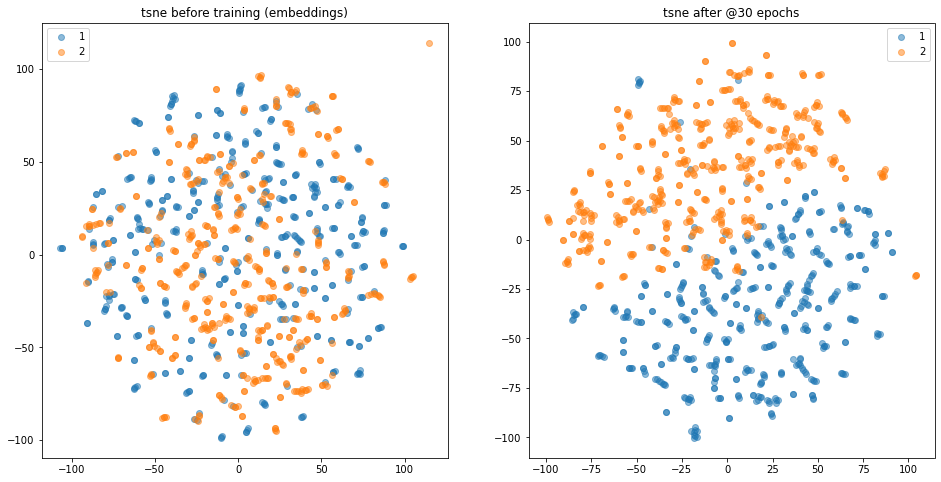

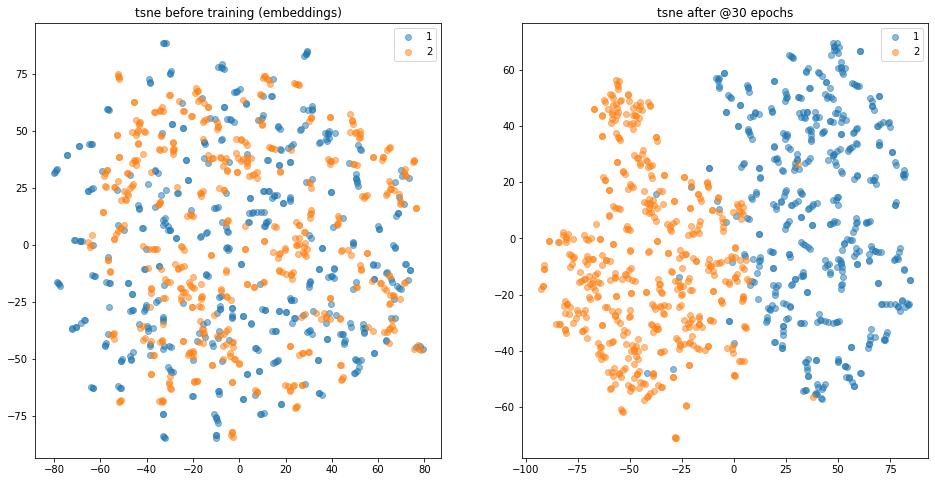

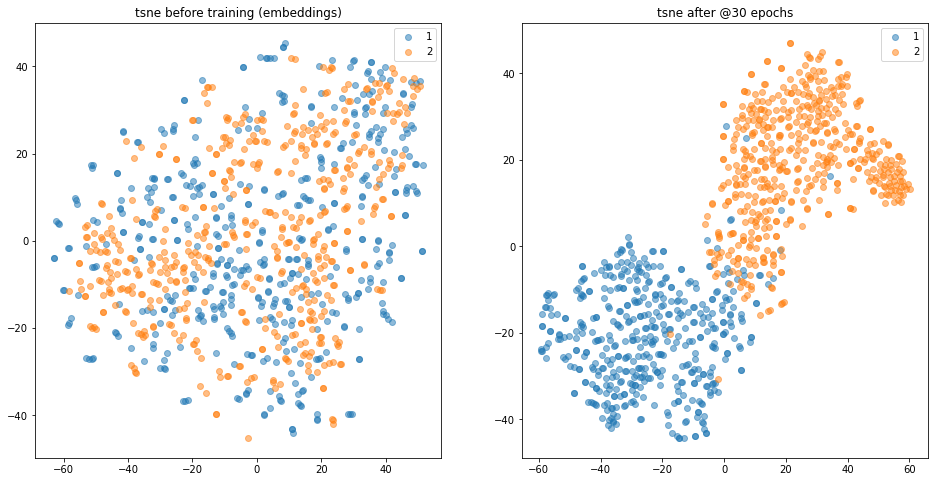

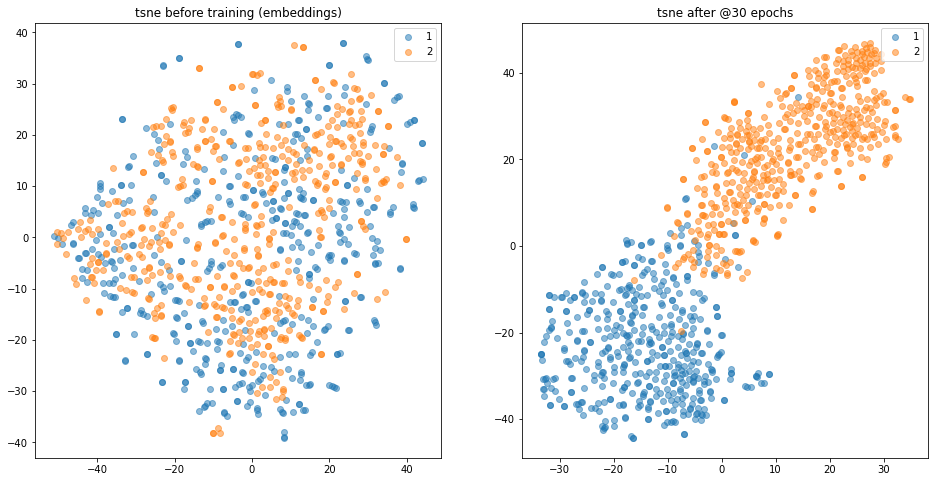

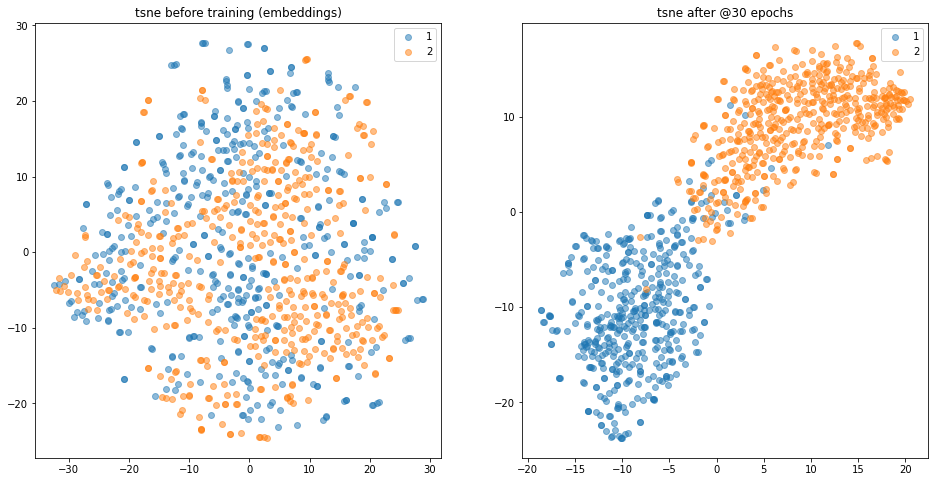

In [6]:

    

batch_size = 32
epochs = 30
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "cross_vert.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,6,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))


if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)



if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!
  #opt = RMSprop()

  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
  
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_cross_vert_transfer2.hdf5'
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')